In [1]:
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
import statistics as stats
from scipy.stats.stats import pearsonr


%matplotlib inline
from IPython.display import display
pd.options.display.max_columns = None
from pandas.plotting import parallel_coordinates

## Loading the data

In [2]:
xls = pd.ExcelFile('Pain data - PediPOP-G data with morph equivalents2.xlsx')
df_SRE = pd.read_excel(xls, 'Surgical Registry EVERYONE')
df_SRE.set_index('PatientID', inplace = True)

#The Calculation Sheet did not have header in the first column. The header 'PatientID' was manually added before the file was loaded in Python
df_morphine = pd.read_excel(xls, 'Calculation Sheet')
list(df_morphine.columns.values)
df_morphine.set_index('PatientID', inplace = True)

xls = pd.ExcelFile('Pre and PediPOP-G Pre-PostVisit 3.17.18 (1).xlsx')
df_VAS = pd.read_excel(xls, 'Pre and PediPOP-G Pre-PostVisit')
df_VAS.set_index('IDNumber', inplace = True)

## Cleaning Surgerical Registry Everyone Data

In [3]:
# Drop selected patients due to lack of data or cancelled surgeries
df_SRE.drop([513,515,544,547],0, inplace = True)

In [4]:
#Selecting selected columns
df_SRE = df_SRE[[              
'GroupingInclusions (1 include, 2 exclude)', \
'Genetics (1 yes, 2=NO)', \
'PatientGender', \
'PatientAge', \
'PatientWeight', \
'PatientRace', \
'WhatSurgery (1=Nuss, 2= Spine, 3=other)', \
'Haller Index (999= not applicable)', \
'Risser', \
'Top level (0-7 Cervical, 8-19 thoracic, 20-24-lumbar, 999 not applicable)', \
'Bottom level (0-7 Cervical, 8-19 thoracic, 20-24-lumbar, 999 not applicable)', \
'# of levels', \
'Shape (1=Rt-left S, 2=left-right, 3= kyphosis; 999=not applicable)', \
'Top degree ', \
'Bottom degree', \
'SurgeryHX', \
'Surgeries', \
'DischargeDate', \
'DODPostOpDay', \
'PostOpHrs', \
'PhoneFollowUpDate', \
'PFUPostOpDay', \
'ASA', \
'Surgeon', \
'PACUManagement = (0=picu; PACU morphine equivalents=PACU; PACU nothing - 0.01; Benadryl9+dose)', \
'ComplementaryTherapies (0=none, 1=guided imagery, 2=massage, 3=guided imagry and massage)', \
'ParentAge', \
'ParentGender', \
'ParentRace', \
'Relationship', \
'PatientPredictive', \
'ParentPredictive', \
'Hrs0_12MeanPainScore', \
'Hrs13_24MeanPainScore', \
'Hrs25_36MeanPainScore', \
'Hrs37_48MeanPainScore', \
'Hrs49_60MeanPainScore', \
'Hrs61_72MeanPainScore', \
'Hrs73_84MeanPainScore', \
'Hrs85_96MeanPainScore', \
'Hrs97_108MeanPainScore', \
'Hrs109_120MeanPainScore', \
'Hrs121_132MeanPainScore', \
'Hrs133_144MeanPainScores', \
'Hrs145_156MeanPainScores', \
'Hrs157_168MeanPainScores', \
'Hrs169_180MeanPainScores', \
'Hrs181_192MeanPainScores'
]]


# Imputing missing values by taking the earlier pain value

* For each patient, the intermediate missing pain values were imputed by taking the pain value for the previous 12 hrs window

In [5]:
#Separating the pain columns for imputation
df_SRE_temp1 = df_SRE[[
    'Hrs0_12MeanPainScore', \
'Hrs13_24MeanPainScore', \
'Hrs25_36MeanPainScore', \
'Hrs37_48MeanPainScore', \
'Hrs49_60MeanPainScore', \
'Hrs61_72MeanPainScore', \
'Hrs73_84MeanPainScore', \
'Hrs85_96MeanPainScore', \
'Hrs97_108MeanPainScore', \
'Hrs109_120MeanPainScore', \
'Hrs121_132MeanPainScore', \
'Hrs133_144MeanPainScores', \
'Hrs145_156MeanPainScores', \
'Hrs157_168MeanPainScores', \
'Hrs169_180MeanPainScores', \
'Hrs181_192MeanPainScores'

]]

In [6]:
#Selecting all the non-pain columns. This dataframe will be used in the end to create the final dataset
df_SRE_woPain = df_SRE[[              
'GroupingInclusions (1 include, 2 exclude)', \
'Genetics (1 yes, 2=NO)', \
'PatientGender', \
'PatientAge', \
'PatientWeight', \
'PatientRace', \
'WhatSurgery (1=Nuss, 2= Spine, 3=other)', \
'Haller Index (999= not applicable)', \
'Risser', \
'Top level (0-7 Cervical, 8-19 thoracic, 20-24-lumbar, 999 not applicable)', \
'Bottom level (0-7 Cervical, 8-19 thoracic, 20-24-lumbar, 999 not applicable)', \
'# of levels', \
'Shape (1=Rt-left S, 2=left-right, 3= kyphosis; 999=not applicable)', \
'Top degree ', \
'Bottom degree', \
'SurgeryHX', \
'Surgeries', \
'DischargeDate', \
'DODPostOpDay', \
'PostOpHrs', \
'PhoneFollowUpDate', \
'PFUPostOpDay', \
'ASA', \
'Surgeon', \
'PACUManagement = (0=picu; PACU morphine equivalents=PACU; PACU nothing - 0.01; Benadryl9+dose)', \
'ComplementaryTherapies (0=none, 1=guided imagery, 2=massage, 3=guided imagry and massage)', \
'ParentAge', \
'ParentGender', \
'ParentRace', \
'Relationship', \
'PatientPredictive', \
'ParentPredictive', \
]]


In [7]:
df_SRE_temp1 = df_SRE_temp1.T

In [8]:
df_SRE_temp2 = df_SRE_temp1

In [9]:
#Removing the unwanted values and computing the mean pain value
df_SRE_temp3 = df_SRE_temp2.T

for i in df_SRE_temp3.columns:
    df_SRE_temp3[i][df_SRE_temp3[i] == 777.0] = np.nan
    df_SRE_temp3[i][df_SRE_temp3[i] == 999.0] = np.nan
df_SRE_temp3
df_SRE_temp2 = df_SRE_temp3.T

In [10]:
#Selecting the index for the latest pain value available for each patient
temp_var = np.nan
max = []
for j in df_SRE_temp2.columns:
    for i in range(df_SRE_temp2.shape[0]-1, 0, -1):
        if (~np.isnan(df_SRE_temp2.iloc[i][j]) and np.isnan(temp_var)):
            temp_var = i
    max.append(temp_var)
    temp_var = np.nan
    
print(max)

[15, 7, 7, 11, 9, 11, 7, 7, 9, 9, 9, 9, 8, 9, 8, 9, 11, 9, 9, 9, 7, 5, 8, 7, 7, 7, 9, 9, 11, 9, 11, 11, 11, 7, 9, 7, 11, 11, 9, 9, 13, 8, 11, 9, 7, 9, 7, 7, 7, 9, 7, 7, 7, 8, 7, 12, 8, 8, 7, 9, 7, 7, 7, 9, 7, 9]


In [11]:
#Inputing the pain values per the methodology mentioned above 
temp_var = 0
for i in df_SRE_temp2.columns:
    for j in range(max[temp_var] + 1):
        if(np.isnan(df_SRE_temp2.iloc[j][i])):
            df_SRE_temp2.iloc[j][i] = df_SRE_temp2.iloc[j-1][i]
    temp_var = temp_var + 1

In [12]:
# Computing the mean pain value
df_SRE_temp3 = df_SRE_temp2.T

df_SRE_temp3['Mean'] = df_SRE_temp3[df_SRE_temp3.columns].mean(axis=1)
df_SRE_temp3

,Hrs0_12MeanPainScore,Hrs13_24MeanPainScore,Hrs25_36MeanPainScore,Hrs37_48MeanPainScore,Hrs49_60MeanPainScore,Hrs61_72MeanPainScore,Hrs73_84MeanPainScore,Hrs85_96MeanPainScore,Hrs97_108MeanPainScore,Hrs109_120MeanPainScore,Hrs121_132MeanPainScore,Hrs133_144MeanPainScores,Hrs145_156MeanPainScores,Hrs157_168MeanPainScores,Hrs169_180MeanPainScores,Hrs181_192MeanPainScores,Mean
PatientID,,,,,,,,,,,,,,,,,
501,7.67,7.83,7.21,7.20,7.500000,6.33,5.71,7.25,7.50,5.83,5.50,6.00,7.00,6.5,4.5,7.0,6.658125
502,4.00,4.33,3.67,3.50,4.000000,3.67,1.50,3.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.458750
503,5.50,1.00,3.75,5.25,4.330000,3.33,5.42,4.33,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.113750
504,5.50,4.00,4.67,4.67,5.400000,5.13,5.50,4.00,5.00,6.20,6.00,6.00,NaN,NaN,NaN,NaN,5.172500
505,3.50,6.29,4.75,5.20,4.330000,4.29,8.00,5.75,6.25,4.75,NaN,NaN,NaN,NaN,NaN,NaN,5.311000
507,2.25,0.00,1.50,1.00,5.000000,6.00,4.00,3.50,5.00,2.40,2.40,3.00,NaN,NaN,NaN,NaN,3.004167
508,2.50,3.67,4.00,3.00,3.670000,3.33,4.00,4.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.552500
509,4.83,4.83,6.00,5.00,5.000000,5.00,3.33,5.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.873750
510,5.00,4.33,3.50,4.33,4.500000,5.50,6.00,4.00,4.00,6.00,NaN,NaN,NaN,NaN,NaN,NaN,4.716000


# Processing the VAS data

In [13]:
#Selecting the relevant columns
df_VAS1 = df_VAS[[
    
'POD1APPTVAS', \
'POD2APPTVAS', \
'POD3APPTVAS', \
'POD4APPTVAS', \
'POD5APPTVAS', \
'POD6APPTVAS', \
'POD7APPTVAS', \
'POD8APPTVAS', \
'PDHomeAPPTVAS', \
'PDClinic1APPTVAS', \
'PDClinic2APPTVAS', \
'PDClinic3APPTVAS', \
'PDClinic4APPTVAS', \
'PDClinic5APPTVAS'    
]]
df_VAS1

,POD1APPTVAS,POD2APPTVAS,POD3APPTVAS,POD4APPTVAS,POD5APPTVAS,POD6APPTVAS,POD7APPTVAS,POD8APPTVAS,PDHomeAPPTVAS,PDClinic1APPTVAS,PDClinic2APPTVAS,PDClinic3APPTVAS,PDClinic4APPTVAS,PDClinic5APPTVAS
IDNumber,,,,,,,,,,,,,,
501.0,73.20,65.98,777.00,777.00,777.00,777.00,68.04,777.0,777.00,0.00,777.00,0.00,NaN,NaN
502.0,45.36,29.90,777.00,777.00,NaN,NaN,NaN,NaN,777.00,0.00,777.00,14.43,NaN,NaN
503.0,36.08,38.14,37.11,72.16,NaN,NaN,NaN,NaN,0.00,35.05,22.68,777.00,777.0,0.0
504.0,36.08,777.00,52.58,777.00,777.00,777.00,NaN,NaN,777.00,7.22,777.00,777.00,0.0,NaN
505.0,65.98,67.01,57.73,16.22,32.99,NaN,NaN,NaN,777.00,25.77,40.21,777.00,25.0,777.0
507.0,10.31,37.11,13.40,9.28,777.00,777.00,NaN,NaN,11.34,23.71,22.68,777.00,NaN,NaN
508.0,51.55,49.48,41.24,38.14,NaN,NaN,NaN,NaN,22.68,0.00,22.68,0.00,8.0,NaN
509.0,43.30,67.01,51.55,777.00,NaN,NaN,NaN,NaN,777.00,0.00,777.00,0.00,NaN,NaN
510.0,68.04,64.95,64.95,64.95,777.00,NaN,NaN,NaN,21.65,23.71,16.49,777.00,777.0,NaN


In [14]:
#Removing the unwanted data
for i in df_VAS1.columns:
    df_VAS1[i][df_VAS1[i] == 777.0] = np.nan
    df_VAS1[i][df_VAS1[i] == 999.0] = np.nan
    df_VAS1[i][df_VAS1[i] == 0] = np.nan
df_VAS1        

C:\Applications\Anaconda3\lib\site-packages\pandas\core\generic.py:7626: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(new_data)
C:\Applications\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2961: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


,POD1APPTVAS,POD2APPTVAS,POD3APPTVAS,POD4APPTVAS,POD5APPTVAS,POD6APPTVAS,POD7APPTVAS,POD8APPTVAS,PDHomeAPPTVAS,PDClinic1APPTVAS,PDClinic2APPTVAS,PDClinic3APPTVAS,PDClinic4APPTVAS,PDClinic5APPTVAS
IDNumber,,,,,,,,,,,,,,
501.0,73.20,65.98,NaN,NaN,NaN,NaN,68.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN
502.0,45.36,29.90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.43,NaN,NaN
503.0,36.08,38.14,37.11,72.16,NaN,NaN,NaN,NaN,NaN,35.05,22.68,NaN,NaN,NaN
504.0,36.08,NaN,52.58,NaN,NaN,NaN,NaN,NaN,NaN,7.22,NaN,NaN,NaN,NaN
505.0,65.98,67.01,57.73,16.22,32.99,NaN,NaN,NaN,NaN,25.77,40.21,NaN,25.0,NaN
507.0,10.31,37.11,13.40,9.28,NaN,NaN,NaN,NaN,11.34,23.71,22.68,NaN,NaN,NaN
508.0,51.55,49.48,41.24,38.14,NaN,NaN,NaN,NaN,22.68,NaN,22.68,NaN,8.0,NaN
509.0,43.30,67.01,51.55,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
510.0,68.04,64.95,64.95,64.95,NaN,NaN,NaN,NaN,21.65,23.71,16.49,NaN,NaN,NaN


In [15]:
#Computing the mean VAS scores and dividing by 10
df_VAS1['MeanVAS'] = df_VAS1[df_VAS1.columns].mean(axis=1) / 10
df_VAS1

C:\Applications\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,POD1APPTVAS,POD2APPTVAS,POD3APPTVAS,POD4APPTVAS,POD5APPTVAS,POD6APPTVAS,POD7APPTVAS,POD8APPTVAS,PDHomeAPPTVAS,PDClinic1APPTVAS,PDClinic2APPTVAS,PDClinic3APPTVAS,PDClinic4APPTVAS,PDClinic5APPTVAS,MeanVAS
IDNumber,,,,,,,,,,,,,,,
501.0,73.20,65.98,NaN,NaN,NaN,NaN,68.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.907333
502.0,45.36,29.90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.43,NaN,NaN,2.989667
503.0,36.08,38.14,37.11,72.16,NaN,NaN,NaN,NaN,NaN,35.05,22.68,NaN,NaN,NaN,4.020333
504.0,36.08,NaN,52.58,NaN,NaN,NaN,NaN,NaN,NaN,7.22,NaN,NaN,NaN,NaN,3.196000
505.0,65.98,67.01,57.73,16.22,32.99,NaN,NaN,NaN,NaN,25.77,40.21,NaN,25.0,NaN,4.136375
507.0,10.31,37.11,13.40,9.28,NaN,NaN,NaN,NaN,11.34,23.71,22.68,NaN,NaN,NaN,1.826143
508.0,51.55,49.48,41.24,38.14,NaN,NaN,NaN,NaN,22.68,NaN,22.68,NaN,8.0,NaN,3.339571
509.0,43.30,67.01,51.55,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.395333
510.0,68.04,64.95,64.95,64.95,NaN,NaN,NaN,NaN,21.65,23.71,16.49,NaN,NaN,NaN,4.639143


In [16]:
df_VAS1.index.names = ['PatientID']

# Merging and creating final db

In [17]:
#Merging the VAS scores table and the SRE pain table
df_SRE_Merged = df_SRE_temp3.merge(df_VAS1, left_on = 'PatientID', right_on = 'PatientID', how = 'left')

In [18]:
#Calculating the Difference in pain column to standardisze the pain with
df_SRE_Merged['PainDiff'] = df_SRE_Merged['Mean'] - df_SRE_Merged['MeanVAS']

# Computing the standardied values

* Columns ending with "Nstd" are pain scores normalized by the mean of the pain scores
* Columns ending with "VASstd" are pain scores normalized by the mean of the pain scores

In [19]:
col_list = ['Hrs0_12MeanPainScore', \
'Hrs13_24MeanPainScore', \
'Hrs25_36MeanPainScore', \
'Hrs37_48MeanPainScore', \
'Hrs49_60MeanPainScore', \
'Hrs61_72MeanPainScore', \
'Hrs73_84MeanPainScore', \
'Hrs85_96MeanPainScore', \
'Hrs97_108MeanPainScore', \
'Hrs109_120MeanPainScore', \
'Hrs121_132MeanPainScore', \
'Hrs133_144MeanPainScores', \
'Hrs145_156MeanPainScores', \
'Hrs157_168MeanPainScores', \
'Hrs169_180MeanPainScores', \
'Hrs181_192MeanPainScores'
]

for i in col_list:
    df_SRE_Merged[i+'VASstd']=df_SRE_Merged[i] - df_SRE_Merged['PainDiff']
    df_SRE_Merged[i+'Nstd']=df_SRE_Merged[i] - df_SRE_Merged['Mean']

In [20]:
# Merging in the pain scores with the rest of the dataset
df_SRE_clean1 = df_SRE_woPain.merge(df_SRE_Merged, left_on = 'PatientID', right_on = 'PatientID', how = 'left')

In [21]:
df_SRE_clean1.columns

Index(['GroupingInclusions (1 include, 2 exclude)', 'Genetics (1 yes, 2=NO)',
       'PatientGender', 'PatientAge', 'PatientWeight', 'PatientRace',
       'WhatSurgery (1=Nuss, 2= Spine, 3=other)',
       'Haller Index (999= not applicable)', 'Risser',
       'Top level (0-7 Cervical, 8-19 thoracic, 20-24-lumbar, 999 not applicable)',
       'Bottom level (0-7 Cervical, 8-19 thoracic, 20-24-lumbar, 999 not applicable)',
       '# of levels',
       'Shape (1=Rt-left S, 2=left-right, 3= kyphosis; 999=not applicable)',
       'Top degree ', 'Bottom degree', 'SurgeryHX', 'Surgeries',
       'DischargeDate', 'DODPostOpDay', 'PostOpHrs', 'PhoneFollowUpDate',
       'PFUPostOpDay', 'ASA', 'Surgeon',
       'PACUManagement = (0=picu; PACU morphine equivalents=PACU; PACU nothing - 0.01; Benadryl9+dose)',
       'ComplementaryTherapies (0=none, 1=guided imagery, 2=massage, 3=guided imagry and massage)',
       'ParentAge', 'ParentGender', 'ParentRace', 'Relationship',
       'PatientPredictive'

In [22]:
# Split into two dataframes.
# Haller for chest surgeries and Risser for spine surgeries
chest_df = df_SRE_clean1[df_SRE_clean1['Haller Index (999= not applicable)'] != 999]
spine_df = df_SRE_clean1[df_SRE_clean1['Risser'] != 999]
print(spine_df.shape,chest_df.shape)

(42, 97) (24, 97)


In [23]:
# Impute missing value for patient 534
spine_df.at[534,'Risser'] = 777
spine_df.at[534, 'Top level (0-7 Cervical, 8-19 thoracic, 20-24-lumbar, 999 not applicable)'] = stats.median(spine_df['Top level (0-7 Cervical, 8-19 thoracic, 20-24-lumbar, 999 not applicable)'])
spine_df.at[534, 'Bottom level (0-7 Cervical, 8-19 thoracic, 20-24-lumbar, 999 not applicable)'] = stats.median(spine_df['Bottom level (0-7 Cervical, 8-19 thoracic, 20-24-lumbar, 999 not applicable)'])
spine_df.at[534, '# of levels'] = stats.median(spine_df['# of levels'])
spine_df.at[534, 'Shape (1=Rt-left S, 2=left-right, 3= kyphosis; 999=not applicable)'] = stats.median(spine_df['Shape (1=Rt-left S, 2=left-right, 3= kyphosis; 999=not applicable)'])
spine_df.at[534, 'Top degree '] = stats.median(spine_df['Top degree '])
spine_df.at[534, 'Bottom degree'] = stats.median(spine_df['Bottom degree'])

Final Datasets:
* spine_df : Contains all data for the spine surgery patients
* chest_df : Contains all data for the chest surgery patients
--------------------------------------------------------------------------------------------------------------------------------------

In [24]:
spine_df.rename(columns = {
    'GroupingInclusions (1 include, 2 exclude)':'Grouping',
    'Genetics (1 yes, 2=NO)':'Genetics',
    'WhatSurgery (1=Nuss, 2= Spine, 3=other)':'WhatSurgery',
    'Top level (0-7 Cervical, 8-19 thoracic, 20-24-lumbar, 999 not applicable)':'Top level',
    'Bottom level (0-7 Cervical, 8-19 thoracic, 20-24-lumbar, 999 not applicable)':'Bottom level',
    'Shape (1=Rt-left S, 2=left-right, 3= kyphosis; 999=not applicable)':'Shape',
    'ComplementaryTherapies (0=none, 1=guided imagery, 2=massage, 3=guided imagry and massage)':'ComplementaryTherapy',
}, inplace=True)

C:\Applications\Anaconda3\lib\site-packages\pandas\core\frame.py:3781: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


In [25]:
chest_df.rename(columns = {
    'GroupingInclusions (1 include, 2 exclude)':'Grouping',
    'Genetics (1 yes, 2=NO)':'Genetics',
    'WhatSurgery (1=Nuss, 2= Spine, 3=other)':'WhatSurgery',
    'Top level (0-7 Cervical, 8-19 thoracic, 20-24-lumbar, 999 not applicable)':'Top level',
    'Bottom level (0-7 Cervical, 8-19 thoracic, 20-24-lumbar, 999 not applicable)':'Bottom level',
    'Shape (1=Rt-left S, 2=left-right, 3= kyphosis; 999=not applicable)':'Shape',
    'ComplementaryTherapies (0=none, 1=guided imagery, 2=massage, 3=guided imagry and massage)':'ComplementaryTherapy',
}, inplace=True)


C:\Applications\Anaconda3\lib\site-packages\pandas\core\frame.py:3781: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


# Exploratory Data Analysis

## Timeline of discharge dates and discharge numbers

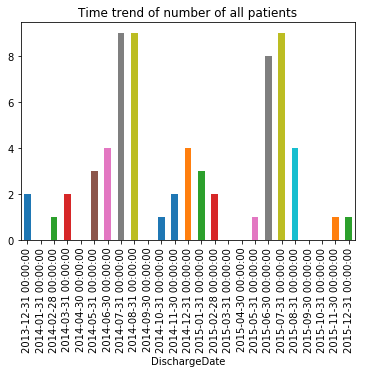

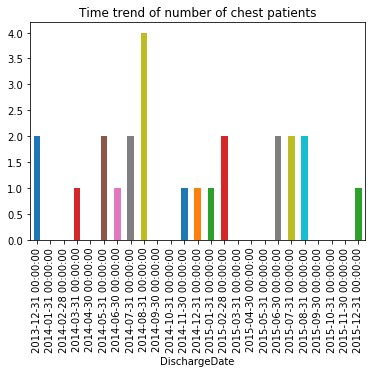

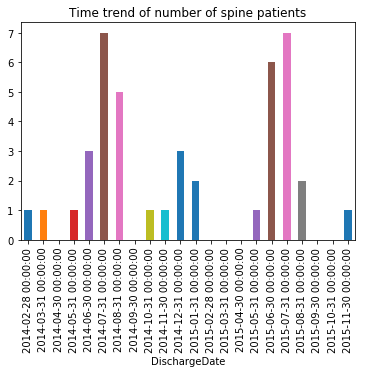

In [26]:
df_SRE_clean2 = df_SRE_clean1
df_SRE_clean2 = df_SRE_clean2.reset_index()
df_SRE_clean2.set_index('DischargeDate', inplace = True)
df_SRE_clean2 = df_SRE_clean2.groupby(pd.Grouper(freq = 'M')).count()
df_SRE_clean2.reset_index(inplace = True)
df_SRE_clean2.plot(x = 'DischargeDate', y = 'PatientID', kind = 'bar', legend = False, title = 'Time trend of number of all patients')

chest_df2 = chest_df
chest_df2 = chest_df2.reset_index()
chest_df2.set_index('DischargeDate', inplace = True)
chest_df2 = chest_df2.groupby(pd.Grouper(freq = 'M')).count()
chest_df2.reset_index(inplace = True)
chest_df2.plot(x = 'DischargeDate', y = 'PatientID', kind = 'bar', legend = False, title = 'Time trend of number of chest patients')

spine_df2 = spine_df
spine_df2 = spine_df2.reset_index()
spine_df2.set_index('DischargeDate', inplace = True)
spine_df2 = spine_df2.groupby(pd.Grouper(freq = 'M')).count()
spine_df2.reset_index(inplace = True)
spine_df2.plot(x = 'DischargeDate', y = 'PatientID', kind = 'bar', legend = False, title = 'Time trend of number of spine patients')

## On average how many days inpatient

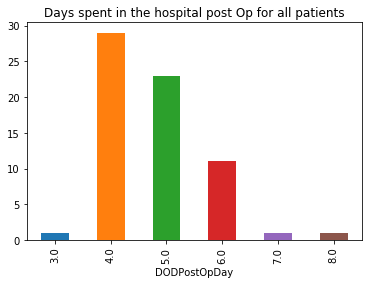

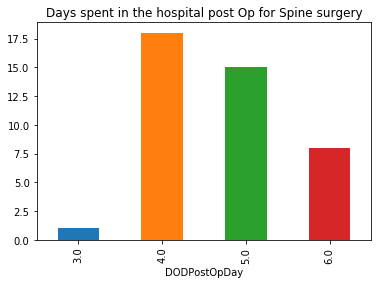

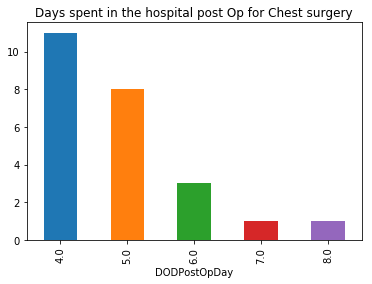

In [27]:
# On average how many days inpatient
df_SRE_clean2 = df_SRE_clean1.reset_index()
df_SRE_clean2 = df_SRE_clean2.groupby('DODPostOpDay',as_index = False).count()
df_SRE_clean2.plot(x = 'DODPostOpDay', y = 'PatientID', kind = 'bar', legend = False, title = 'Days spent in the hospital post Op for all patients')

spine_df2 = spine_df.reset_index()
spine_df2 = spine_df2.groupby('DODPostOpDay',as_index = False).count()
spine_df2.plot(x = 'DODPostOpDay', y = 'PatientID', kind = 'bar', legend = False, title = 'Days spent in the hospital post Op for Spine surgery')

chest_df2 = chest_df.reset_index()
chest_df2 = chest_df2.groupby('DODPostOpDay',as_index = False).count()
chest_df2.plot(x = 'DODPostOpDay', y = 'PatientID', kind = 'bar', legend = False, title = 'Days spent in the hospital post Op for Chest surgery')

## Plots of mean pain scores over time

In [28]:
col_list1 = ['Hrs0_12MeanPainScoreVASstd', \
'Hrs13_24MeanPainScoreVASstd', \
'Hrs25_36MeanPainScoreVASstd', \
'Hrs37_48MeanPainScoreVASstd', \
'Hrs49_60MeanPainScoreVASstd', \
'Hrs61_72MeanPainScoreVASstd', \
'Hrs73_84MeanPainScoreVASstd', \
'Hrs85_96MeanPainScoreVASstd', \
'Hrs97_108MeanPainScoreVASstd', \
'Hrs109_120MeanPainScoreVASstd', \
'Hrs121_132MeanPainScoreVASstd', \
'Hrs133_144MeanPainScoresVASstd', \
'Hrs145_156MeanPainScoresVASstd', \
'Hrs157_168MeanPainScoresVASstd', \
'Hrs169_180MeanPainScoresVASstd', \
'Hrs181_192MeanPainScoresVASstd'
]

col_list2 = ['Hrs0_12MeanPainScoreNstd', \
'Hrs13_24MeanPainScoreNstd', \
'Hrs25_36MeanPainScoreNstd', \
'Hrs37_48MeanPainScoreNstd', \
'Hrs49_60MeanPainScoreNstd', \
'Hrs61_72MeanPainScoreNstd', \
'Hrs73_84MeanPainScoreNstd', \
'Hrs85_96MeanPainScoreNstd', \
'Hrs97_108MeanPainScoreNstd', \
'Hrs109_120MeanPainScoreNstd', \
'Hrs121_132MeanPainScoreNstd', \
'Hrs133_144MeanPainScoresNstd', \
'Hrs145_156MeanPainScoresNstd', \
'Hrs157_168MeanPainScoresNstd', \
'Hrs169_180MeanPainScoresNstd', \
'Hrs181_192MeanPainScoresNstd'
]


Text(0.5,1,'Trend of mean VAS Standardized pain scores')

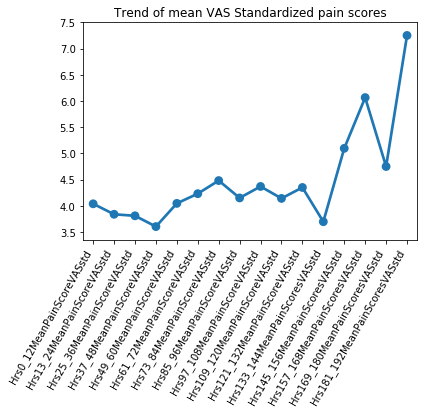

In [29]:
sb.pointplot(col_list1, [df_SRE_clean1[rng].sum()/df_SRE_clean1[rng].count() for rng in col_list1], order = list(col_list1))
plt.xticks(rotation = 60, ha='right')
plt.title("Trend of mean VAS Standardized pain scores")

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16]),
 <a list of 16 Text xticklabel objects>)

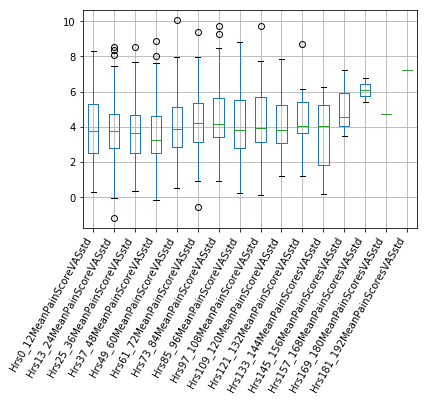

In [30]:
df_SRE_clean1[col_list1].boxplot()
plt.xticks(rotation = 60, ha='right')

Text(0.5,1,'Trend of mean Normal Standardized pain scores')

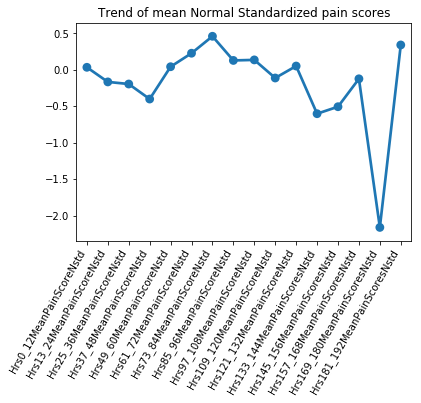

In [31]:
sb.pointplot(col_list2, [df_SRE_clean1[rng].sum()/df_SRE_clean1[rng].count() for rng in col_list2], order = list(col_list2))
plt.xticks(rotation = 60, ha='right')
plt.title("Trend of mean Normal Standardized pain scores")

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16]),
 <a list of 16 Text xticklabel objects>)

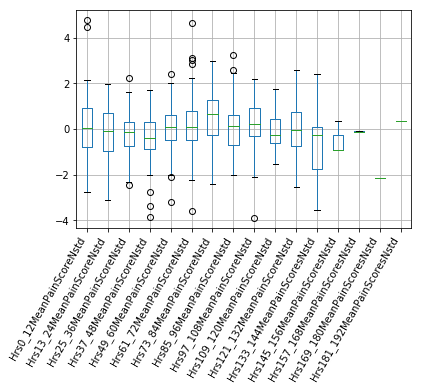

In [32]:
df_SRE_clean1[col_list2].boxplot()
plt.xticks(rotation = 60, ha='right')

# Analyses

## Surgery History vs. Pain Level

In [33]:
spine_df['Hrs0_24MeanPainScoreVASstd'] = (spine_df['Hrs0_12MeanPainScoreVASstd'] + spine_df['Hrs13_24MeanPainScoreVASstd']) / 2
spine_df['Hrs0_72MeanPainScoreVASstd'] = (spine_df['Hrs0_12MeanPainScoreVASstd'] + spine_df['Hrs13_24MeanPainScoreVASstd'] + \
                                          spine_df['Hrs25_36MeanPainScoreVASstd'] + spine_df['Hrs37_48MeanPainScoreVASstd'] + \
                                          spine_df['Hrs49_60MeanPainScoreVASstd'] + spine_df['Hrs61_72MeanPainScoreVASstd']) / 6 

chest_df['Hrs0_24MeanPainScoreVASstd'] = (chest_df['Hrs0_12MeanPainScoreVASstd'] + chest_df['Hrs13_24MeanPainScoreVASstd']) / 2
chest_df['Hrs0_72MeanPainScoreVASstd'] = (chest_df['Hrs0_12MeanPainScoreVASstd'] + chest_df['Hrs13_24MeanPainScoreVASstd'] + \
                                          chest_df['Hrs25_36MeanPainScoreVASstd'] + chest_df['Hrs37_48MeanPainScoreVASstd'] + \
                                          chest_df['Hrs49_60MeanPainScoreVASstd'] + chest_df['Hrs61_72MeanPainScoreVASstd']) / 6                                           
                                          

C:\Applications\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
C:\Applications\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Applications\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pand

### Analyzing for Spine Data

#### Pain Trend for patients with and without Surgery History

In [34]:
surgeryhist = spine_df[["SurgeryHX","Surgeries","Hrs0_12MeanPainScoreNstd","Hrs13_24MeanPainScoreNstd","Hrs25_36MeanPainScoreNstd",\
            "Hrs37_48MeanPainScoreNstd","Hrs49_60MeanPainScoreNstd","Hrs61_72MeanPainScoreNstd"]]


In [35]:
#Split the patients into two groups: patients with surgery history/ patients without surgery history
had_surgery = surgeryhist[surgeryhist["SurgeryHX"]==1]
no_surgery = surgeryhist[surgeryhist["SurgeryHX"]==0]

In [36]:
#Average mean pain score over the first 72 hours
avg_pain_had = had_surgery.mean()
avg_pain_no = no_surgery.mean()

In [37]:
df_mean = pd.DataFrame({
    "hr_after_operation": ["0-12","13-24","25-36","37-48","49-60","61-72"],
    "has surgery history": list(avg_pain_had[1:]),
    "no surgery history": list(avg_pain_no[2:])})
df_mean

ValueError: arrays must all be same length

In [38]:
ax = df_mean.plot(title="Average Mean pain trend over 72 hr")
plt.legend(['Patients w/ surgery history', 'Patients w/o surgery history'])
plt.xlabel('Hr after operation')
plt.ylabel('Pain Score')
ax.set_xticks(df_mean.index)
ax.set_xticklabels(df_mean.hr_after_operation)
plt.show()

NameError: name 'df_mean' is not defined

#### Absolute Pain for 0-24 hrs and 0-72 hrs vs Surgery History

In [39]:
surgeryhist = spine_df[["SurgeryHX","Hrs0_24MeanPainScoreVASstd"]]

In [40]:
#Split the patients into two groups: patients with surgery history/ patients without surgery history
had_surgery = surgeryhist[surgeryhist["SurgeryHX"]==1]
no_surgery = surgeryhist[surgeryhist["SurgeryHX"]==0]

In [41]:
#Average mean pain score over the first 24 hours
avg_pain_had = had_surgery.mean()
avg_pain_no = no_surgery.mean()

In [42]:
df_mean = pd.DataFrame({
    "hr_after_operation": ["0-24"],
    "has surgery history": list(avg_pain_had[1:]),
    "no surgery history": list(avg_pain_no[1:])})
df_mean

,hr_after_operation,has surgery history,no surgery history
0,0-24,3.147207,4.075915


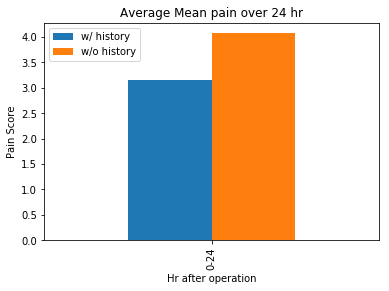

In [43]:
ax = df_mean.plot(kind = 'bar',title="Average Mean pain over 24 hr")
plt.legend(['w/ history', 'w/o history'])
plt.xlabel('Hr after operation')
plt.ylabel('Pain Score')
ax.set_xticks(df_mean.index)
ax.set_xticklabels(df_mean.hr_after_operation)
plt.show()

In [44]:
surgeryhist = spine_df[["SurgeryHX","Hrs0_72MeanPainScoreVASstd"]]

In [45]:
#Split the patients into two groups: patients with surgery history/ patients without surgery history
had_surgery = surgeryhist[surgeryhist["SurgeryHX"]==1]
no_surgery = surgeryhist[surgeryhist["SurgeryHX"]==0]

In [46]:
#Average mean pain score over the first 72 hours
avg_pain_had = had_surgery.mean()
avg_pain_no = no_surgery.mean()

In [47]:
df_mean = pd.DataFrame({
    "hr_after_operation": ["0-72"],
    "has surgery history": list(avg_pain_had[1:]),
    "no surgery history": list(avg_pain_no[1:])})
df_mean

,hr_after_operation,has surgery history,no surgery history
0,0-72,3.202022,4.087447


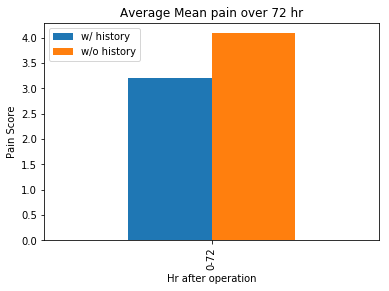

In [48]:
ax = df_mean.plot(kind = 'bar',title="Average Mean pain over 72 hr")
plt.legend(['w/ history', 'w/o history'])
plt.xlabel('Hr after operation')
plt.ylabel('Pain Score')
ax.set_xticks(df_mean.index)
ax.set_xticklabels(df_mean.hr_after_operation)
plt.show()

### Analyzing for Chest Data

#### Pain Trend for patients with and without Surgery History

In [54]:
surgeryhist = chest_df[["SurgeryHX","Surgeries","Hrs0_12MeanPainScoreNstd","Hrs13_24MeanPainScoreNstd","Hrs25_36MeanPainScoreNstd",\
            "Hrs37_48MeanPainScoreNstd","Hrs49_60MeanPainScoreNstd","Hrs61_72MeanPainScoreNstd"]]

In [55]:
#Split the patients into two groups: patients with surgery history/ patients without surgery history
had_surgery = surgeryhist[surgeryhist["SurgeryHX"]==1]
no_surgery = surgeryhist[surgeryhist["SurgeryHX"]==0]

In [60]:
#Average mean pain score over the first 72 hours
avg_pain_had = had_surgery.mean()
avg_pain_no = no_surgery.mean()

In [61]:
df_mean = pd.DataFrame({
    "hr_after_operation": ["0-12","13-24","25-36","37-48","49-60","61-72"],
    "has surgery history": list(avg_pain_had[1:]),
    "no surgery history": list(avg_pain_no[2:])})
df_mean

,hr_after_operation,has surgery history,no surgery history
0,0-12,0.675497,-0.241898
1,13-24,-0.495753,0.367477
2,25-36,-0.720753,0.123727
3,37-48,0.086747,-0.195023
4,49-60,0.264247,0.080602
5,61-72,0.264247,-0.110648


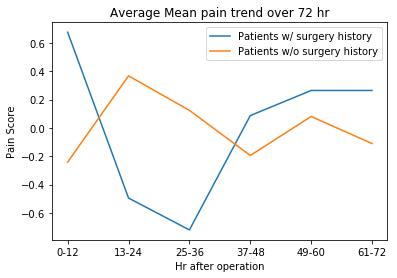

In [62]:
ax = df_mean.plot(title="Average Mean pain trend over 72 hr")
plt.legend(['Patients w/ surgery history', 'Patients w/o surgery history'])
plt.xlabel('Hr after operation')
plt.ylabel('Pain Score')
ax.set_xticks(df_mean.index)
ax.set_xticklabels(df_mean.hr_after_operation)
plt.show()

#### Absolute Pain for 0-24 hrs and 0-72 hrs vs Surgery History

In [63]:
surgeryhist = chest_df[["SurgeryHX","Hrs0_24MeanPainScoreVASstd"]]

In [64]:
#Split the patients into two groups: patients with surgery history/ patients without surgery history
had_surgery = surgeryhist[surgeryhist["SurgeryHX"]==1]
no_surgery = surgeryhist[surgeryhist["SurgeryHX"]==0]

In [65]:
#Average mean pain score over the first 24 hours
avg_pain_had = had_surgery.mean()
avg_pain_no = no_surgery.mean()

In [66]:
df_mean = pd.DataFrame({
    "hr_after_operation": ["0-24"],
    "has surgery history": list(avg_pain_had[1:]),
    "no surgery history": list(avg_pain_no[1:])})
df_mean

,hr_after_operation,has surgery history,no surgery history
0,0-24,3.535108,4.299227


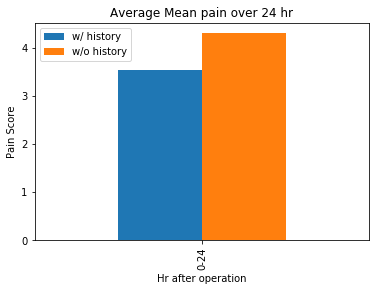

In [67]:
ax = df_mean.plot(kind = 'bar',title="Average Mean pain over 24 hr")
plt.legend(['w/ history', 'w/o history'])
plt.xlabel('Hr after operation')
plt.ylabel('Pain Score')
ax.set_xticks(df_mean.index)
ax.set_xticklabels(df_mean.hr_after_operation)
plt.show()

In [68]:
surgeryhist = chest_df[["SurgeryHX","Hrs0_72MeanPainScoreVASstd"]]

In [69]:
#Split the patients into two groups: patients with surgery history/ patients without surgery history
had_surgery = surgeryhist[surgeryhist["SurgeryHX"]==1]
no_surgery = surgeryhist[surgeryhist["SurgeryHX"]==0]

In [70]:
#Average mean pain score over the first 24 hours
avg_pain_had = had_surgery.mean()
avg_pain_no = no_surgery.mean()

In [71]:
df_mean = pd.DataFrame({
    "hr_after_operation": ["0-72"],
    "has surgery history": list(avg_pain_had[1:]),
    "no surgery history": list(avg_pain_no[1:])})
df_mean

,hr_after_operation,has surgery history,no surgery history
0,0-72,3.457608,4.240477


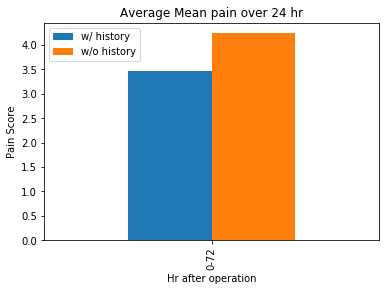

In [72]:
ax = df_mean.plot(kind = 'bar',title="Average Mean pain over 24 hr")
plt.legend(['w/ history', 'w/o history'])
plt.xlabel('Hr after operation')
plt.ylabel('Pain Score')
ax.set_xticks(df_mean.index)
ax.set_xticklabels(df_mean.hr_after_operation)
plt.show()

## Patient Predictive vs. Pain Level

### Spine Data

In [73]:
spine_df1 = spine_df[spine_df['PatientPredictive'] < 150]

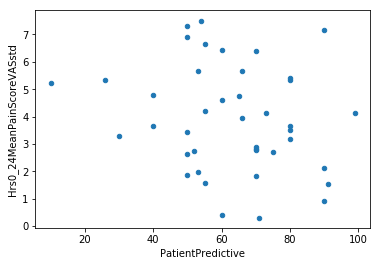

In [74]:
spine_df1.plot(x = 'PatientPredictive',y='Hrs0_24MeanPainScoreVASstd', kind = 'scatter')

In [75]:
pearsonr(spine_df1['PatientPredictive'], spine_df1['Hrs0_24MeanPainScoreVASstd'])

(-0.2062298183348622, 0.19579123884828625)

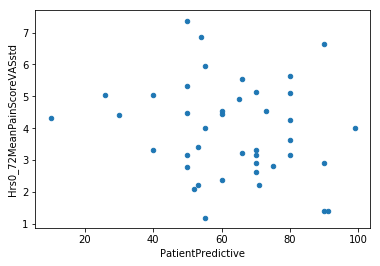

In [76]:
spine_df1.plot(x = 'PatientPredictive',y='Hrs0_72MeanPainScoreVASstd', kind = 'scatter')

In [77]:
pearsonr(spine_df1['PatientPredictive'], spine_df1['Hrs0_72MeanPainScoreVASstd'])

(-0.1791523413308916, 0.2623917388334611)

### Chest Data

In [78]:
chest_df1 = chest_df[chest_df['PatientPredictive'] < 150]

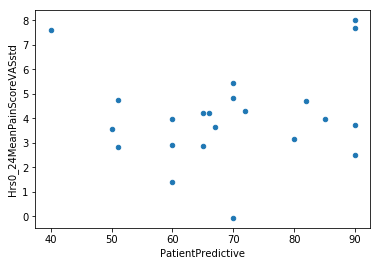

In [79]:
chest_df1.plot(x = 'PatientPredictive',y='Hrs0_24MeanPainScoreVASstd', kind = 'scatter')

In [80]:
pearsonr(chest_df1['PatientPredictive'], chest_df1['Hrs0_24MeanPainScoreVASstd'])

(0.12044232715968937, 0.5934114279942664)

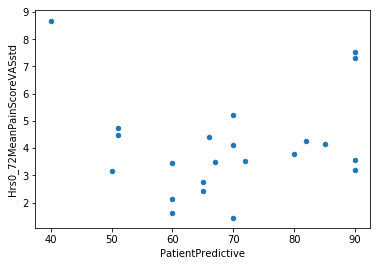

In [81]:
chest_df1.plot(x = 'PatientPredictive',y='Hrs0_72MeanPainScoreVASstd', kind = 'scatter')

In [82]:
pearsonr(chest_df1['PatientPredictive'], chest_df1['Hrs0_72MeanPainScoreVASstd'])

(0.05265381070168112, 0.8159841150263474)

# Clustering Testing for Spine Patients

In [83]:
%store -r

In [84]:
spine_df.rename(columns = {
    'GroupingInclusions (1 include, 2 exclude)':'Grouping',
    'Genetics (1 yes, 2=NO)':'Genetics',
    'WhatSurgery (1=Nuss, 2= Spine, 3=other)':'WhatSurgery',
    'Top level (0-7 Cervical, 8-19 thoracic, 20-24-lumbar, 999 not applicable)':'Top level',
    'Bottom level (0-7 Cervical, 8-19 thoracic, 20-24-lumbar, 999 not applicable)':'Bottom level',
    'Shape (1=Rt-left S, 2=left-right, 3= kyphosis; 999=not applicable)':'Shape',
}, inplace=True)

C:\Applications\Anaconda3\lib\site-packages\pandas\core\frame.py:3781: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


# Clustering
## KMeans

In [85]:
from sklearn.cluster import KMeans

In [86]:
# Pain scores not part of clustering by patient characteristics.
spine_df_features = spine_df[spine_df.columns[:-83]]

# Haller index and what type of surgery not applicable so dropped.
spine_df_features = spine_df_features.drop('Haller Index (999= not applicable)', axis = 1)
spine_df_features = spine_df_features.drop('WhatSurgery', axis=1)

# Fill all 777 missing values of Risser, Shape, and Bottom degree with median values.
# Bottom degree dependent on shape so imputed similarly.
spine_df_features.loc[spine_df_features['Risser'] == 777.0, 'Risser'] = spine_df_features['Risser'].median()
spine_df_features.loc[spine_df_features['Shape'] == 777.0, 'Shape'] = spine_df_features['Shape'].median()
spine_df_features.loc[spine_df_features['Bottom degree'] == 999.0, 'Bottom degree'] = spine_df_features['Bottom degree'].median()

# Create categorical variables for top and bottom level categories.
spine_df_features['top_level_categories'] = pd.cut(spine_df_features['Top level'],[-1,7,19,24,999],labels=[1,2,3,4])
spine_df_features['bottom_level_categories'] = pd.cut(spine_df_features['Bottom level'],[-1,7,19,24,999],labels=[1,2,3,4])

spine_df_features

,Grouping,Genetics,PatientGender,PatientAge,PatientWeight,PatientRace,Risser,Top level,Bottom level,# of levels,Shape,Top degree,Bottom degree,SurgeryHX,top_level_categories,bottom_level_categories
PatientID,,,,,,,,,,,,,,,,
504,1,1,2,137,63.0,1,4.0,11,22.0,11,1.0,51.0,42.00,0,2,3
508,1,1,1,234,57.7,1,5.0,10,21.0,11,3.0,89.0,51.25,0,2,3
509,1,1,2,158,40.0,1,4.0,11,21.0,10,2.0,40.0,23.00,0,2,3
510,1,1,2,177,58.0,1,4.0,11,22.0,11,1.0,67.0,59.00,0,2,3
511,1,1,2,165,63.0,1,2.0,11,22.0,11,1.0,59.0,51.00,0,2,3
512,1,1,1,238,76.2,1,4.0,10,22.0,12,3.0,71.0,51.25,1,2,3
514,1,1,2,156,83.0,1,4.0,10,22.0,12,1.0,65.0,60.00,1,2,3
516,1,1,2,155,50.9,3,4.0,11,22.0,11,2.0,31.0,69.00,1,2,3
517,2,1,2,181,45.8,4,3.0,10,22.0,12,1.0,34.0,56.00,0,2,3


In [87]:
spine_df_features.shape

(42, 16)

In [88]:
model3 = KMeans(n_clusters=3)
model3.fit(spine_df_features)
labels3 = model3.predict(spine_df_features)
cents3 = model3.cluster_centers_

model4 = KMeans(n_clusters=4)
model4.fit(spine_df_features)
labels4 = model4.predict(spine_df_features)
cents4 = model4.cluster_centers_

model5 = KMeans(n_clusters=5)
model5.fit(spine_df_features)
labels5 = model5.predict(spine_df_features)
cents5 = model5.cluster_centers_

In [89]:
spine_df_labels = spine_df_features.copy()
spine_df_labels['kmeans3_label'] = labels3
spine_df_labels['kmeans5_label'] = labels5

In [90]:
cents3

array([[1.00000000e+00, 1.11764706e+00, 1.94117647e+00, 1.60941176e+02,
        6.27470588e+01, 2.47058824e+00, 3.17647059e+00, 1.11176471e+01,
        2.16470588e+01, 1.05294118e+01, 1.47058824e+00, 5.14117647e+01,
        5.79411765e+01, 1.76470588e-01, 2.00000000e+00, 2.94117647e+00],
       [1.16666667e+00, 1.00000000e+00, 1.16666667e+00, 2.41500000e+02,
        6.75000000e+01, 1.00000000e+00, 4.66666667e+00, 1.06666667e+01,
        2.11666667e+01, 1.03333333e+01, 2.33333333e+00, 4.79166667e+01,
        5.18333333e+01, 6.66666667e-01, 2.00000000e+00, 2.83333333e+00],
       [1.05263158e+00, 1.10526316e+00, 1.73684211e+00, 1.85157895e+02,
        5.72052632e+01, 1.89473684e+00, 3.73684211e+00, 1.31052632e+01,
        2.13157895e+01, 8.21052632e+00, 1.52631579e+00, 3.78421053e+01,
        3.94736842e+01, 1.05263158e-01, 2.00000000e+00, 2.94736842e+00]])

Text(0.5,1,'Correlations across features for spine surgery patients')

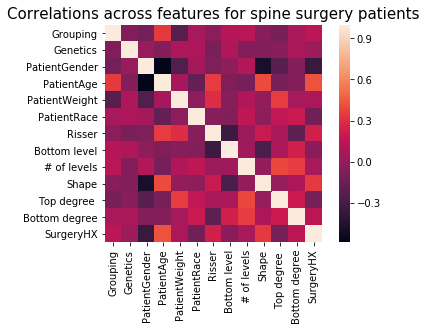

In [91]:
ax = plt.axes()
sb.heatmap(spine_df_features.corr(), square=True)
ax.set_title('Correlations across features for spine surgery patients', size=15)

Cluster 0
Grouping: Included
Genetics: Yes
Gender: Female
Age: 165.625
Weight: 49.225
Race: Value between black and asian
Risser: 2.75
Top level: 11.625
Bottom level: 21.25
\# of levels: 9.625
Shape: 1.75
Top degree: 34.5
Bottom degree: 61.875
Surgery HX: 0.25 (more likely not to have had surgery)

Cluster 1
Grouping: Included
Genetics: Yes
Gender: leaning Female
Age: 180.4
Weight: 55.72
Race: black and asian leaning black
Risser: 3.6
Top level: 12.6
Bottom level: 21
\# of levels: 8.4
Shape: 1.6
Top degree: 43.2
Bottom degree: 28.9
Surgery HX: 0.1 (more likely not to have had surgery)

Cluster 2
Grouping: Included
Genetics: Yes
Gender: Male
Age: 246.8
Weight: 60.24
Race: White
Risser: 4.6
Top level: 10.6
Bottom level: 21.2
\# of levels: 10.4
Shape: 2.4
Top degree: 49.7
Bottom degree: 51.8
Surgery HX: 0.8 (likely to have had surgery)

Cluster 3
Grouping: Included
Genetics: Yes
Gender: Female
Age: 195.375
Weight: 67.7625
Race: leaning white (1.125)
Risser: 4
Top level: 14.125
Bottom level: 21.75
\# of levels: 7.625
Shape: 1.5
Top degree: 32.375
Bottom degree: 49.375
Surgery HX: 0.125 (more likely not to have had surgery)

Cluster 4
Grouping: Included
Genetics: Yes
Gender: Female
Age: 161.55
Weight: 69.48
Race: 2.36 (middle of asian and black)
Risser: 3.63
Top level: 10.64
Bottom level: 21.82
\# of levels: 11.18
Shape: 1.27
Top degree: 60.45
Bottom degree: 55.27
Surgery HX: 0.09 (more likely not to have had surgery)

Text(0.5,1,'K Means with k=3')

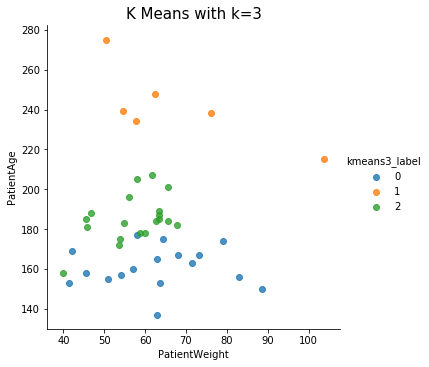

In [92]:
facet = sb.lmplot(data=spine_df_labels, x='PatientWeight', y='PatientAge', hue='kmeans3_label', 
                   fit_reg=False, legend=True, legend_out=True)
axes = facet.axes.flatten()
axes[0].set_title('K Means with k=3', size = 15)

Text(0.5,1,'K Means with k=5')

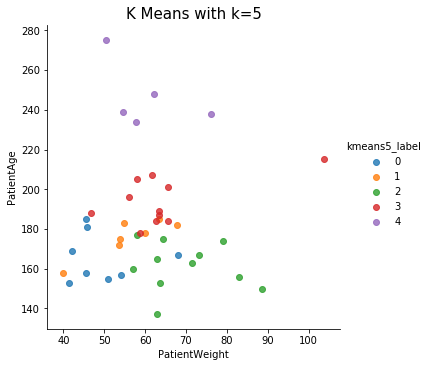

In [93]:
facet = sb.lmplot(data=spine_df_labels, x='PatientWeight', y='PatientAge', hue='kmeans5_label', 
                   fit_reg=False, legend=True, legend_out=True)
axes = facet.axes.flatten()
axes[0].set_title('K Means with k=5', size = 15)

In [94]:
spine_df_features.columns[:-2]

Index(['Grouping', 'Genetics', 'PatientGender', 'PatientAge', 'PatientWeight',
       'PatientRace', 'Risser', 'Top level', 'Bottom level', '# of levels',
       'Shape', 'Top degree ', 'Bottom degree', 'SurgeryHX'],
      dtype='object')

Text(0.5,1,'Feature heat map for 3 clusters')

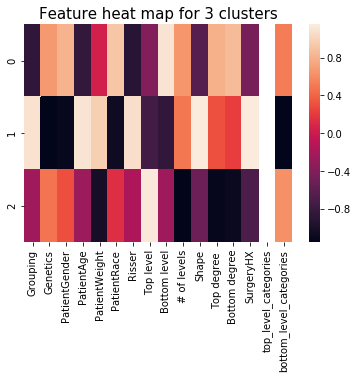

In [95]:
kmeans3_df = pd.DataFrame(cents3, columns = spine_df_features.columns)
kmeans3_df_norm = (kmeans3_df - kmeans3_df.mean())/kmeans3_df.std()
ax = plt.axes()
sb.heatmap(kmeans3_df_norm)
ax.set_title('Feature heat map for 3 clusters', size=15)

Text(0.5,1,'Correlations across features for 5 clusters')

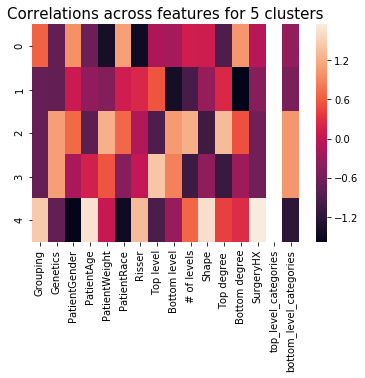

In [96]:
kmeans5_df = pd.DataFrame(cents5, columns = spine_df_features.columns)
kmeans5_df_norm = (kmeans5_df - kmeans5_df.mean())/kmeans5_df.std()
ax = plt.axes()
sb.heatmap(kmeans5_df_norm)
ax.set_title('Correlations across features for 5 clusters', size=15)

## PCA Plotting

In [97]:
from sklearn.decomposition import PCA as sklearnPCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

In [98]:
# normalizing the feature set
spine_df_features.drop('top_level_categories',1,inplace=True)
spine_df_features.drop('bottom_level_categories',1,inplace=True)
spine_df_features_norm = (spine_df_features - spine_df_features.mean())/spine_df_features.std()

In [99]:
pca = sklearnPCA(n_components=2)
transformed = pd.DataFrame(pca.fit_transform(spine_df_features_norm))

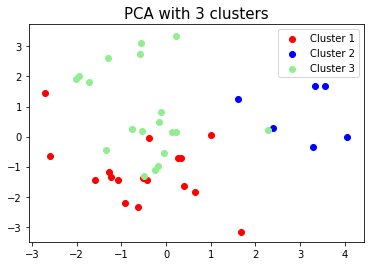

In [100]:
plt.scatter(transformed[labels3==0][0], transformed[labels3==0][1], label='Cluster 1', c='red')
plt.scatter(transformed[labels3==1][0], transformed[labels3==1][1], label='Cluster 2', c='blue')
plt.scatter(transformed[labels3==2][0], transformed[labels3==2][1], label='Cluster 3', c='lightgreen')
plt.title('PCA with 3 clusters', size = 15)
plt.legend()
plt.show()

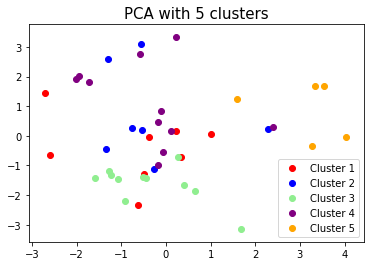

In [101]:
plt.scatter(transformed[labels5==0][0], transformed[labels5==0][1], label='Cluster 1', c='red')
plt.scatter(transformed[labels5==1][0], transformed[labels5==1][1], label='Cluster 2', c='blue')
plt.scatter(transformed[labels5==2][0], transformed[labels5==2][1], label='Cluster 3', c='lightgreen')
plt.scatter(transformed[labels5==3][0], transformed[labels5==3][1], label='Cluster 4', c='purple')
plt.scatter(transformed[labels5==4][0], transformed[labels5==4][1], label='Cluster 5', c='orange')
plt.title('PCA with 5 clusters', size = 15)
plt.legend()
plt.show()

In [102]:
model3_pca = KMeans(n_clusters=3)
model3_pca.fit(transformed)
labels3_pca = model3_pca.predict(transformed)
cents3_pca = model3_pca.cluster_centers_

model4_pca = KMeans(n_clusters=4)
model4_pca.fit(transformed)
labels4_pca = model4_pca.predict(transformed)
cents4_pca = model4_pca.cluster_centers_

model5_pca = KMeans(n_clusters=5)
model5_pca.fit(transformed)
labels5_pca = model5_pca.predict(transformed)
cents5_pca = model5_pca.cluster_centers_

In [103]:
sum(labels3_pca == labels3)/len(labels3)
# sum(labels4_pca == labels4)/len(labels4)
sum(labels5_pca == labels5)/len(labels5)

0.23809523809523808

In [104]:
# labels_transformed[0].head()

Text(0.5,1,'K Means with k=4')

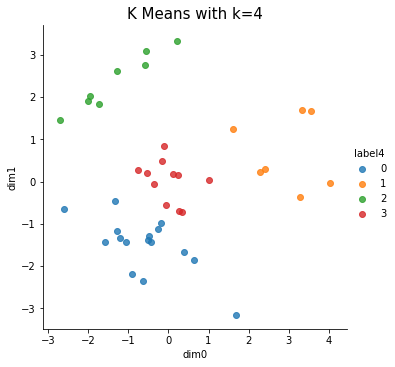

In [105]:
labels_transformed = transformed.copy()
labels_transformed.columns = ['dim0','dim1']
labels_transformed['label3'] = labels3_pca
labels_transformed['label4'] = labels4_pca
labels_transformed['label5'] = labels5_pca
facet = sb.lmplot(data=labels_transformed, x='dim0', y='dim1', hue='label4', 
                   fit_reg=False, legend=True, legend_out=True)
axes = facet.axes.flatten()
axes[0].set_title('K Means with k=4', size = 15)

In [106]:
from scipy.spatial.distance import cdist,pdist
from scipy.cluster.vq import kmeans
from matplotlib import cm

In [107]:
# for k in range(1,11):
#     model_pca = KMeans(n_clusters=k)
#     model_pca.fit(transformed)
#     labels_pca = model_pca.predict(transformed)
#     cents_pca = model_pca.cluster_centers_

Text(0.5,1,'Elbow for KMeans clustering')

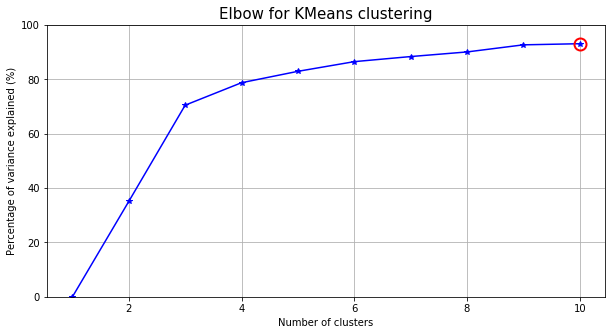

In [108]:
# Selection process for number of folds.
# Just enough folds to explain up to 80% of the variance.

kmax = 10
krange = range(1, kmax+1)

km = [kmeans(transformed, k) for k in krange]
centroids = [cent for (cent, var) in km]
distances_k = [cdist(transformed, cent, 'euclidean') for cent in centroids]
cIdx = [np.argmin(D,axis=1) for D in distances_k]
dist = [np.min(D,axis=1) for D in distances_k]

tot_withinss = [sum(d**2) for d in dist]  # Total within-cluster sum of squares
totss = sum(pdist(transformed)**2)/transformed.shape[0]       # The total sum of squares
betweenss = totss - tot_withinss          # The between-cluster sum of squares

##### plots #####
kIdx = 9        # K=10

clr = cm.nipy_spectral( np.linspace(0,1,10) ).tolist()
mrk = 'os^p<dvh8>+x.'

# elbow curve
fig = plt.figure(figsize = (10,5))
ax = fig.add_subplot(111)
ax.plot(krange, betweenss/totss*100, 'b*-')
ax.plot(krange[kIdx], betweenss[kIdx]/totss*100, marker='o', markersize=12, 
    markeredgewidth=2, markeredgecolor='r', markerfacecolor='None')
ax.set_ylim((0,100))
plt.grid(True)
plt.xlabel('Number of clusters')
plt.ylabel('Percentage of variance explained (%)')
plt.title('Elbow for KMeans clustering', size=15)

In [109]:
labels4_pca

array([0, 1, 3, 0, 0, 1, 0, 3, 0, 3, 2, 3, 2, 3, 1, 3, 1, 2, 1, 0, 3, 3,
       0, 0, 2, 2, 0, 1, 0, 2, 0, 0, 0, 3, 2, 2, 0, 3, 3, 1, 0, 0])

## Parallel coordinates trendlines

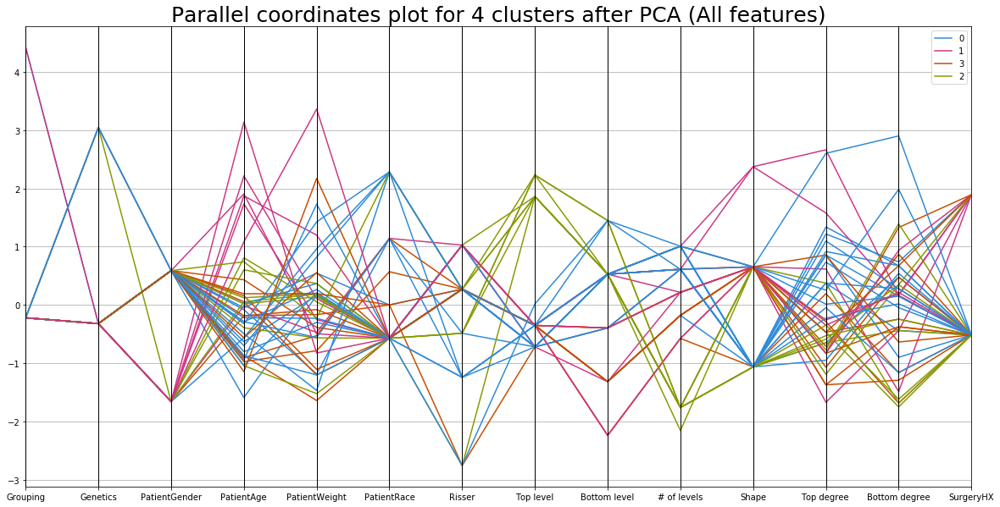

In [110]:
# Trendline changes across clusters for all variables.
colours = ['#2e8ad8', '#cd3785', '#c64c00', '#889a00']
plt.figure(figsize=(20,10))
plot_feats_all = list(spine_df_features_norm.columns)
data_norm_all = spine_df_features_norm.copy()[plot_feats_all]
data_norm_all['kmeans4_pca_label'] = labels4_pca
parallel_coordinates(data_norm_all, 'kmeans4_pca_label', color=colours)
plt.title("Parallel coordinates plot for 4 clusters after PCA (All features)", size = 25)
plt.show()

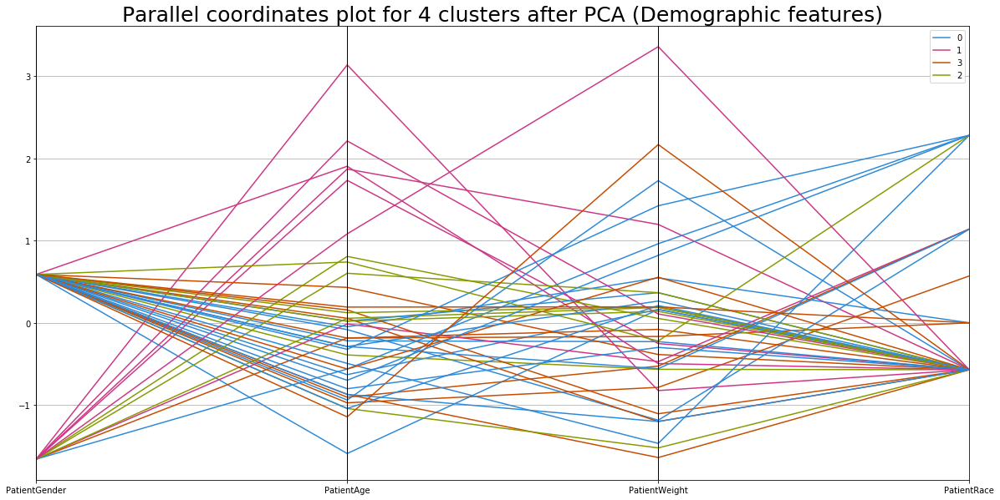

In [111]:
# Trendline changes across clusters for demographic variables.
plt.figure(figsize=(20,10))
plot_feats1 = ['PatientGender', 'PatientAge', 'PatientWeight', 'PatientRace']
data_norm_dem = spine_df_features_norm.copy()[plot_feats1]
data_norm_dem['kmeans4_pca_label'] = labels4_pca
plt.title("Parallel coordinates plot for 4 clusters after PCA (Demographic features)", size = 25)
parallel_coordinates(data_norm_dem, 'kmeans4_pca_label', color=colours)
plt.show()

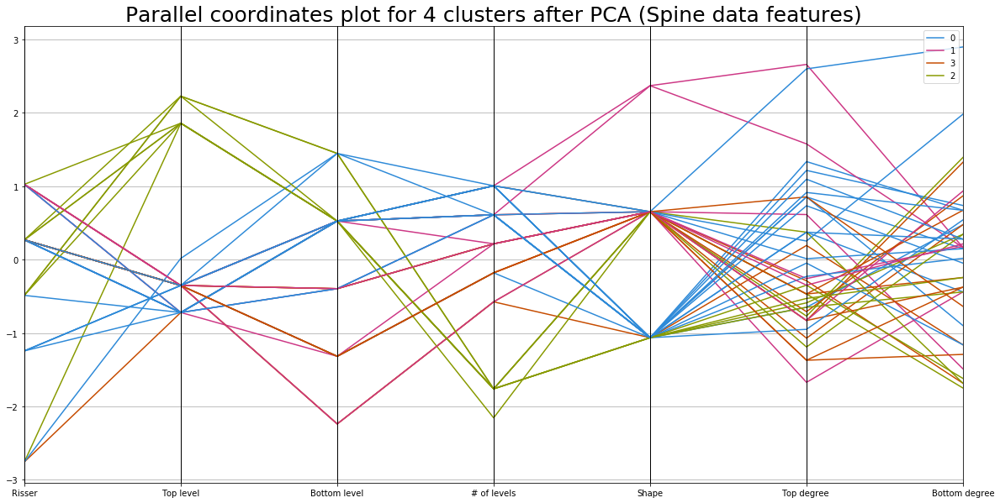

In [112]:
# Trendline changes across clusters for spine location and curvature values.
plt.figure(figsize=(20,10))
plot_feats2 = ['Risser', 'Top level', 'Bottom level', '# of levels',
       'Shape', 'Top degree ', 'Bottom degree']
data_norm_spine = spine_df_features_norm.copy()[plot_feats2]
data_norm_spine['kmeans4_pca_label'] = labels4_pca
plt.title("Parallel coordinates plot for 4 clusters after PCA (Spine data features)", size = 25)
parallel_coordinates(data_norm_spine, 'kmeans4_pca_label', color=colours)
plt.show()

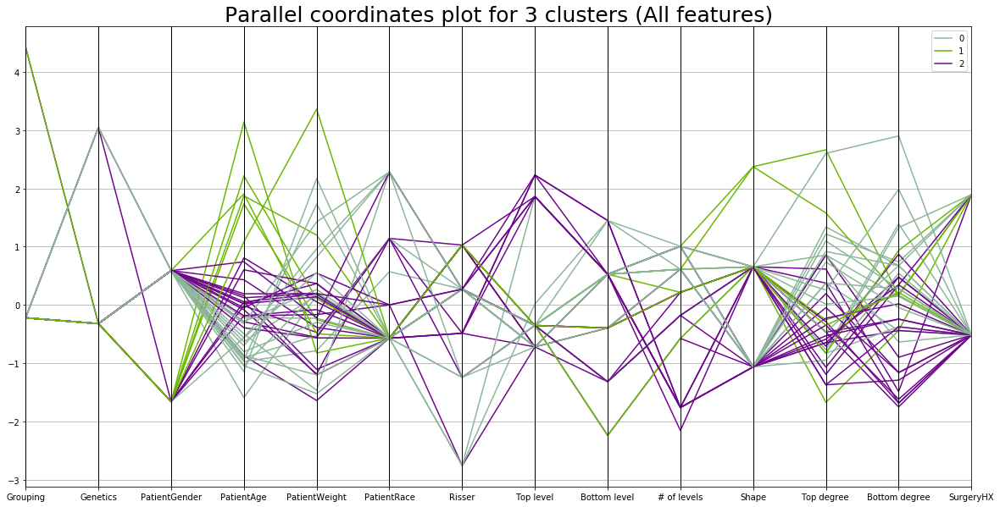

In [113]:
# Trendline changes across clusters for all variables.
plt.figure(figsize=(20,10))
plot_feats_all = list(spine_df_features_norm.columns)
data_norm_all = spine_df_features_norm.copy()[plot_feats_all]
data_norm_all['kmeans3_label'] = labels3

parallel_coordinates(data_norm_all, 'kmeans3_label')
plt.title("Parallel coordinates plot for 3 clusters (All features)", size = 25)
plt.show()

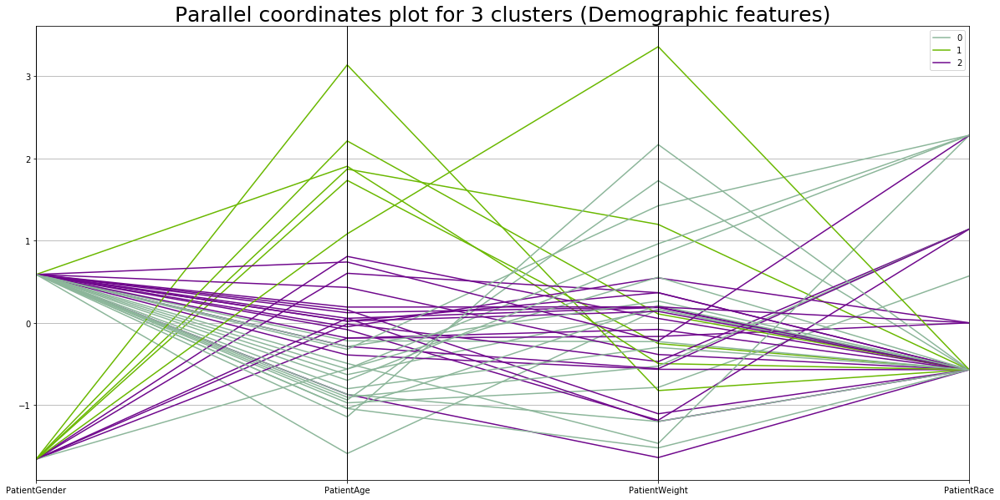

In [114]:
# Trendline changes across clusters for demographic variables.
plt.figure(figsize=(20,10))
plot_feats1 = ['PatientGender', 'PatientAge', 'PatientWeight', 'PatientRace']
data_norm_dem = spine_df_features_norm.copy()[plot_feats1]
data_norm_dem['kmeans3_label'] = labels3
plt.title("Parallel coordinates plot for 3 clusters (Demographic features)", size = 25)
parallel_coordinates(data_norm_dem, 'kmeans3_label')
plt.show()

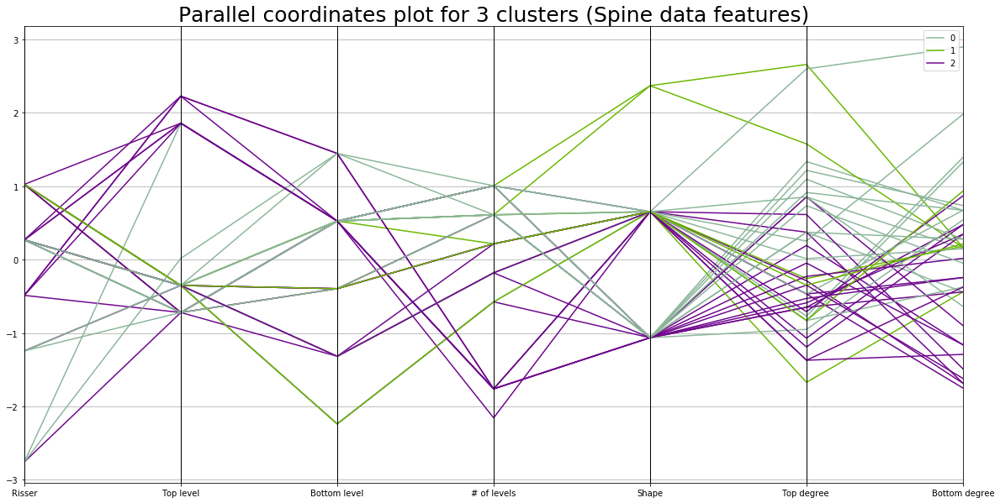

In [115]:
# Trendline changes across clusters for spine location and curvature values.
plt.figure(figsize=(20,10))
plot_feats2 = ['Risser', 'Top level', 'Bottom level', '# of levels',
       'Shape', 'Top degree ', 'Bottom degree']
data_norm_spine = spine_df_features_norm.copy()[plot_feats2]
data_norm_spine['kmeans3_label'] = labels3
plt.title("Parallel coordinates plot for 3 clusters (Spine data features)", size = 25)
parallel_coordinates(data_norm_spine, 'kmeans3_label')
plt.show()

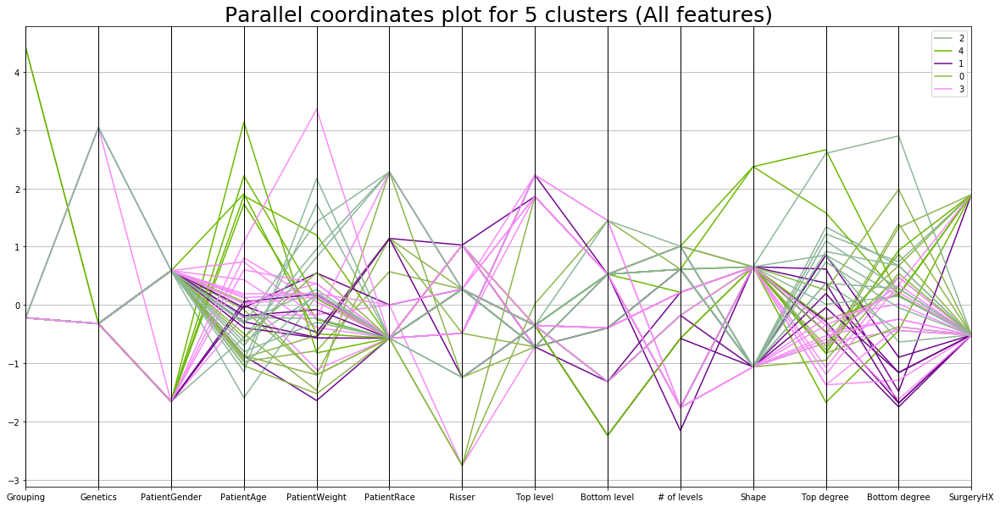

In [116]:
# FOR FIVE CLUSTERS
# Trendline changes across clusters for all variables.
plt.figure(figsize=(20,10))
plot_feats_all = list(spine_df_features_norm.columns)
data_norm_all = spine_df_features_norm.copy()[plot_feats_all]
data_norm_all['kmeans5_label'] = labels5
plt.title("Parallel coordinates plot for 5 clusters (All features)", size = 25)
parallel_coordinates(data_norm_all, 'kmeans5_label')
plt.show()

## Separating original dataframe by patient ID's using 4 clusters

In [117]:
spine_df['kmeans4_pca'] = labels4_pca
cluster1 = spine_df[spine_df['kmeans4_pca'] == 0]
cluster2 = spine_df[spine_df['kmeans4_pca'] == 1]
cluster3 = spine_df[spine_df['kmeans4_pca'] == 2]
cluster4 = spine_df[spine_df['kmeans4_pca'] == 3]

C:\Applications\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [118]:
# pd.DataFrame(cluster1[])

In [119]:
standardized_cols = ['Hrs0_12MeanPainScoreNstd',
       'Hrs13_24MeanPainScoreNstd',
       'Hrs25_36MeanPainScoreNstd',
       'Hrs37_48MeanPainScoreNstd',
       'Hrs49_60MeanPainScoreNstd',
       'Hrs61_72MeanPainScoreNstd',
       'Hrs73_84MeanPainScoreNstd',
       'Hrs85_96MeanPainScoreNstd',
       'Hrs97_108MeanPainScoreNstd',
       'Hrs109_120MeanPainScoreNstd',
       'Hrs121_132MeanPainScoreNstd',
       'Hrs133_144MeanPainScoresNstd',
       'Hrs145_156MeanPainScoresNstd',
       'Hrs157_168MeanPainScoresNstd',
       'Hrs169_180MeanPainScoresNstd',
       'Hrs181_192MeanPainScoresNstd']

C:\Applications\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0.5,0,'Time interval')

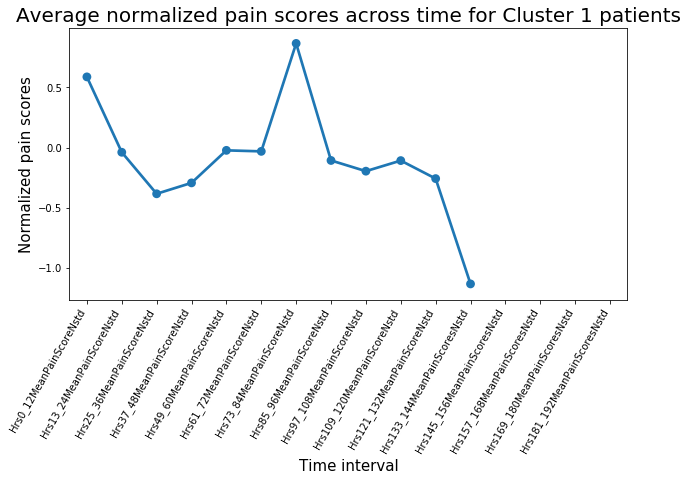

In [120]:
cluster1 = cluster1[standardized_cols]
plt.figure(figsize = (10,5))
sb.pointplot(list(cluster1.columns), [cluster1[rng].sum()/cluster1[rng].count() for rng in list(cluster1.columns)], order = list(cluster1.columns))
plt.xticks(rotation = 60, ha='right')

plt.title("Average normalized pain scores across time for Cluster 1 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

Text(0.5,0,'Time interval')

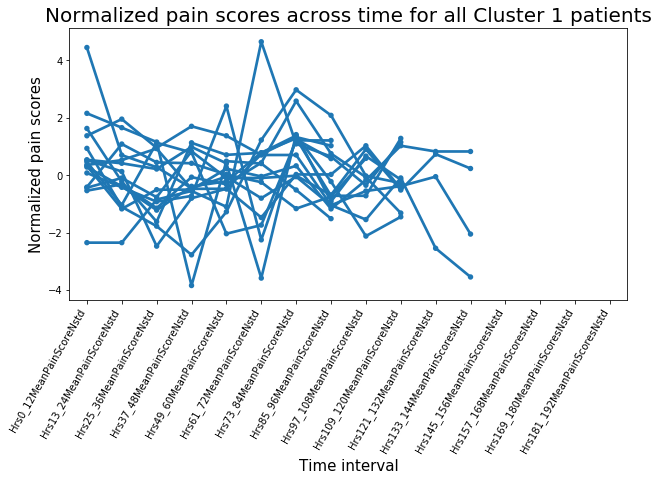

In [121]:
plt.figure(figsize = (10,5))
for i, (name, row) in enumerate(cluster1.iterrows()):
    sb.pointplot(list(cluster1.columns), row, order = list(cluster1.columns), markers = '.')
    plt.xticks(rotation = 60, ha='right')

plt.title("Normalized pain scores across time for all Cluster 1 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

Text(0.5,0,'Time interval')

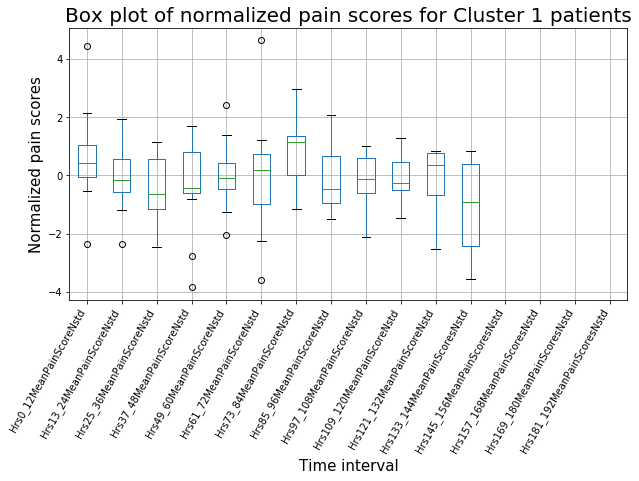

In [122]:
plt.figure(figsize = (10,5))
cluster1.boxplot()
plt.xticks(rotation = 60, ha='right')
plt.title("Box plot of normalized pain scores for Cluster 1 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

C:\Applications\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0.5,0,'Time interval')

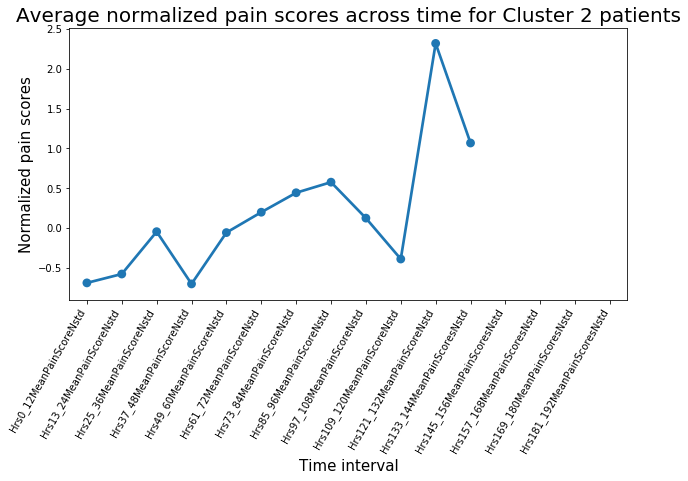

In [123]:
cluster2 = cluster2[standardized_cols]
plt.figure(figsize = (10,5))
sb.pointplot(list(cluster2.columns), [cluster2[rng].sum()/cluster2[rng].count() for rng in list(cluster2.columns)], order = list(cluster2.columns))
plt.xticks(rotation = 60, ha='right')
plt.title("Average normalized pain scores across time for Cluster 2 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

Text(0.5,0,'Time interval')

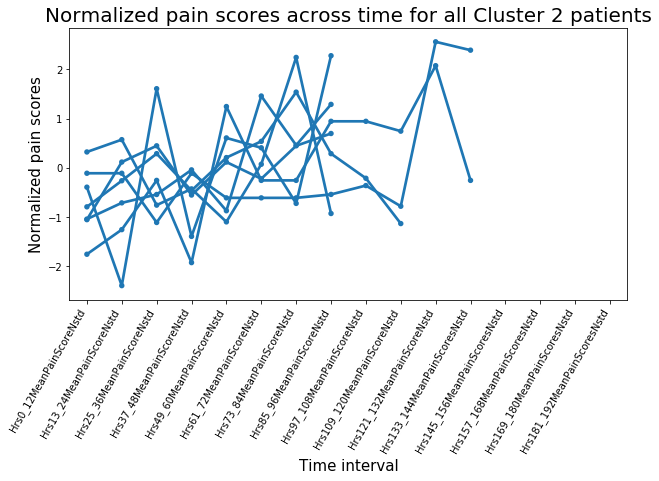

In [124]:
plt.figure(figsize = (10,5))
for i, (name, row) in enumerate(cluster2.iterrows()):
    sb.pointplot(list(cluster2.columns), row, order = list(cluster2.columns), markers = '.')
    plt.xticks(rotation = 60, ha='right')
    plt.title("Normalized pain scores across time for all Cluster 2 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

Text(0.5,0,'Time interval')

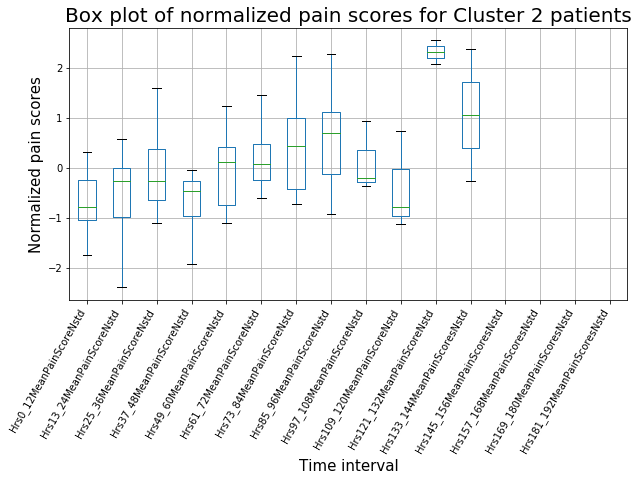

In [125]:
plt.figure(figsize = (10,5))
cluster2.boxplot()
plt.xticks(rotation = 60, ha='right')
plt.title("Box plot of normalized pain scores for Cluster 2 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

C:\Applications\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0.5,0,'Time interval')

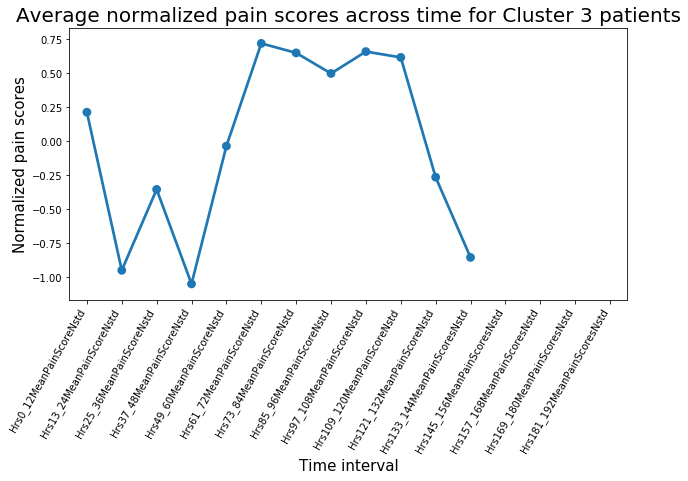

In [126]:
cluster3 = cluster3[standardized_cols]
plt.figure(figsize = (10,5))
sb.pointplot(list(cluster3.columns), [cluster3[rng].sum()/cluster3[rng].count() for rng in list(cluster3.columns)], order = list(cluster3.columns))
plt.xticks(rotation = 60, ha='right')
plt.title("Average normalized pain scores across time for Cluster 3 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

Text(0.5,0,'Time interval')

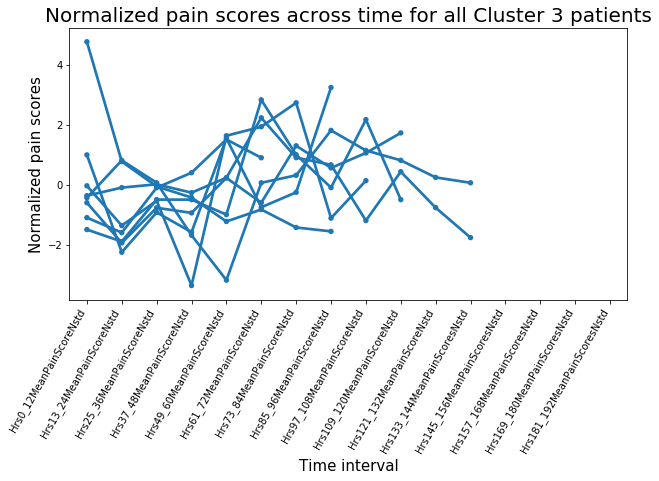

In [127]:
plt.figure(figsize = (10,5))
for i, (name, row) in enumerate(cluster3.iterrows()):
    sb.pointplot(list(cluster3.columns), row, order = list(cluster3.columns), markers = '.')
    plt.xticks(rotation = 60, ha='right')
plt.title("Normalized pain scores across time for all Cluster 3 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

Text(0.5,0,'Time interval')

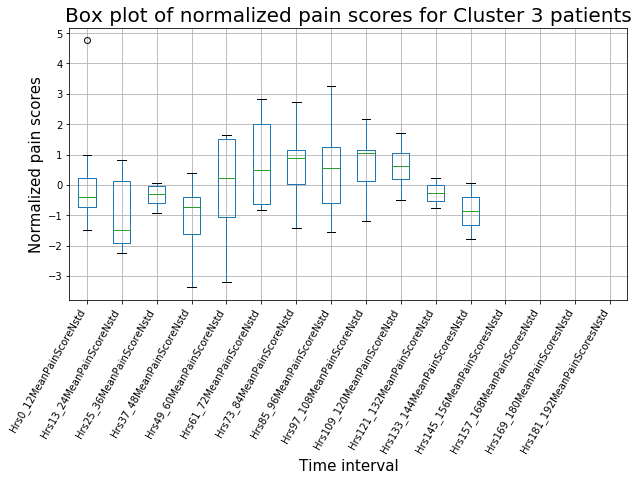

In [128]:
plt.figure(figsize = (10,5))
cluster3.boxplot()
plt.xticks(rotation = 60, ha='right')
plt.title("Box plot of normalized pain scores for Cluster 3 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

C:\Applications\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0.5,0,'Time interval')

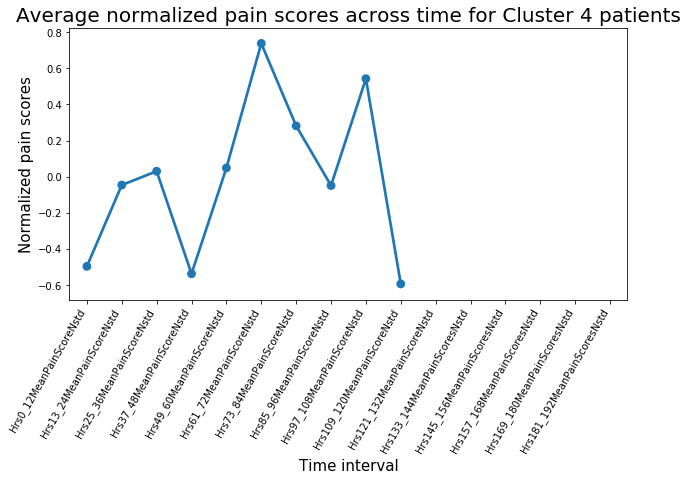

In [129]:
cluster4 = cluster4[standardized_cols]
plt.figure(figsize = (10,5))
sb.pointplot(list(cluster4.columns), [cluster4[rng].sum()/cluster4[rng].count() for rng in list(cluster4.columns)], order = list(cluster4.columns))
plt.xticks(rotation = 60, ha='right')
plt.title("Average normalized pain scores across time for Cluster 4 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

Text(0.5,0,'Time interval')

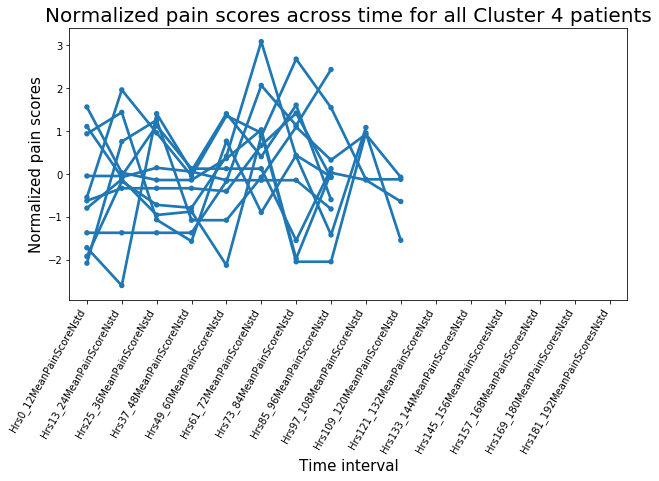

In [130]:
plt.figure(figsize = (10,5))
for i, (name, row) in enumerate(cluster4.iterrows()):
    sb.pointplot(list(cluster4.columns), row, order = list(cluster4.columns), markers = '.')
    plt.xticks(rotation = 60, ha='right')
plt.title("Normalized pain scores across time for all Cluster 4 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

Text(0.5,0,'Time interval')

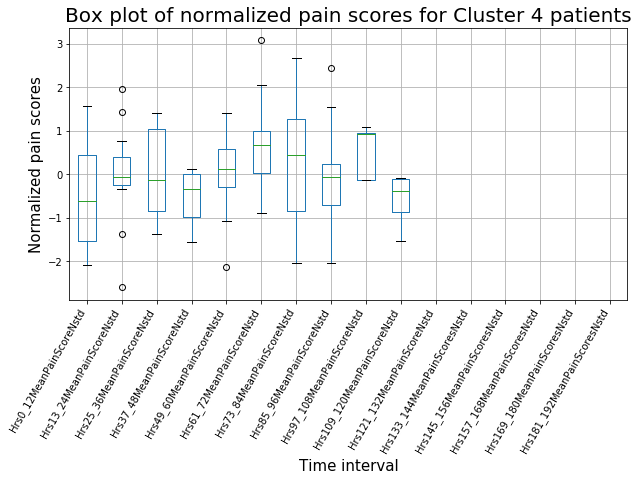

In [131]:
plt.figure(figsize = (10,5))
cluster4.boxplot()
plt.xticks(rotation = 60, ha='right')
plt.title("Box plot of normalized pain scores for Cluster 4 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

## Separating original dataframe by patient ID's using 3 clusters

In [132]:
spine_df['kmeans3'] = labels3
cluster1 = spine_df[spine_df['kmeans3'] == 0]
cluster2 = spine_df[spine_df['kmeans3'] == 1]
cluster3 = spine_df[spine_df['kmeans3'] == 2]

C:\Applications\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [133]:
cluster1.shape

(17, 101)

In [134]:
cluster2.shape

(6, 101)

In [135]:
cluster3.shape

(19, 101)

In [136]:
standardized_cols = ['Hrs0_12MeanPainScoreNstd',
       'Hrs13_24MeanPainScoreNstd',
       'Hrs25_36MeanPainScoreNstd',
       'Hrs37_48MeanPainScoreNstd',
       'Hrs49_60MeanPainScoreNstd',
       'Hrs61_72MeanPainScoreNstd',
       'Hrs73_84MeanPainScoreNstd',
       'Hrs85_96MeanPainScoreNstd',
       'Hrs97_108MeanPainScoreNstd',
       'Hrs109_120MeanPainScoreNstd',
       'Hrs121_132MeanPainScoreNstd',
       'Hrs133_144MeanPainScoresNstd',
       'Hrs145_156MeanPainScoresNstd',
       'Hrs157_168MeanPainScoresNstd',
       'Hrs169_180MeanPainScoresNstd',
       'Hrs181_192MeanPainScoresNstd']

## Cluster 1 pain plot

C:\Applications\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0.5,0,'Time interval')

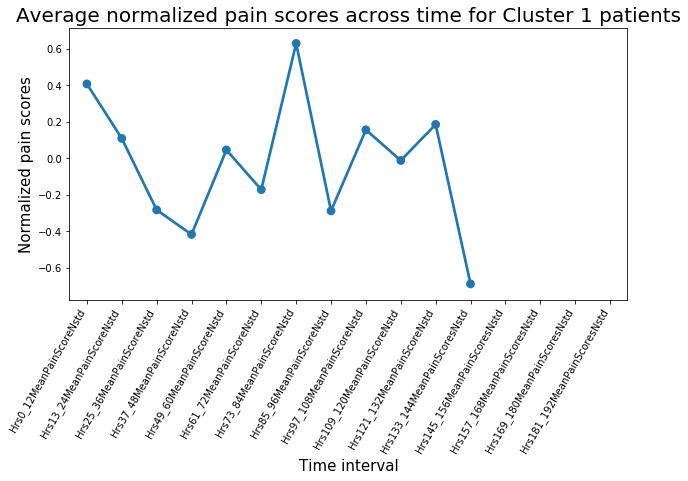

In [137]:
cluster1 = cluster1[standardized_cols]
plt.figure(figsize = (10,5))
sb.pointplot(list(cluster1.columns), [cluster1[rng].sum()/cluster1[rng].count() for rng in list(cluster1.columns)], order = list(cluster1.columns))
plt.xticks(rotation = 60, ha='right')

plt.title("Average normalized pain scores across time for Cluster 1 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

Text(0.5,0,'Time interval')

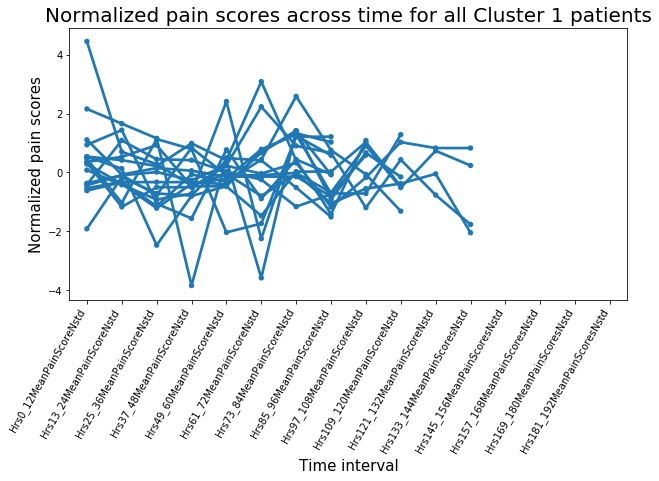

In [138]:
plt.figure(figsize = (10,5))
for i, (name, row) in enumerate(cluster1.iterrows()):
    sb.pointplot(list(cluster1.columns), row, order = list(cluster1.columns), markers = '.')
    plt.xticks(rotation = 60, ha='right')

plt.title("Normalized pain scores across time for all Cluster 1 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

Text(0.5,0,'Time interval')

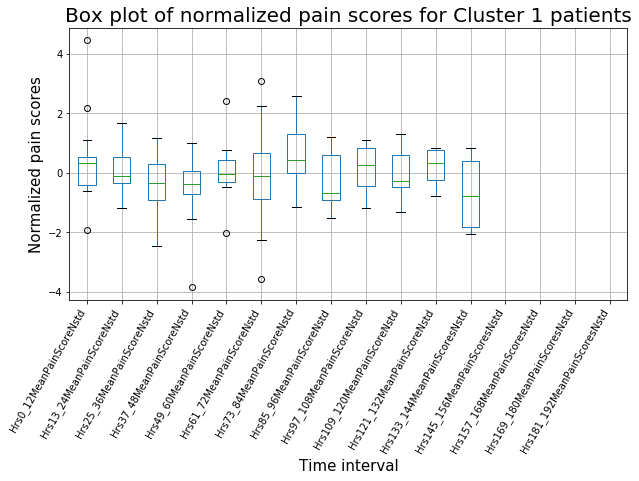

In [139]:
plt.figure(figsize = (10,5))
cluster1.boxplot()
plt.xticks(rotation = 60, ha='right')
plt.title("Box plot of normalized pain scores for Cluster 1 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

## Cluster 2 pain plot

C:\Applications\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0.5,0,'Time interval')

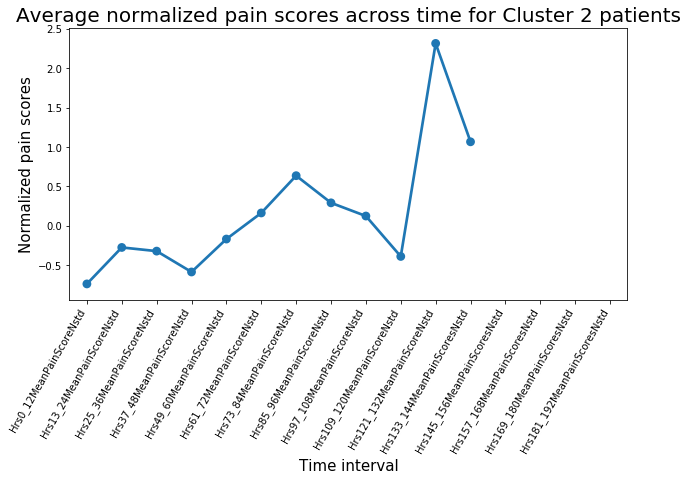

In [140]:
cluster2 = cluster2[standardized_cols]
plt.figure(figsize = (10,5))
sb.pointplot(list(cluster2.columns), [cluster2[rng].sum()/cluster2[rng].count() for rng in list(cluster2.columns)], order = list(cluster2.columns))
plt.xticks(rotation = 60, ha='right')
plt.title("Average normalized pain scores across time for Cluster 2 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

Text(0.5,0,'Time interval')

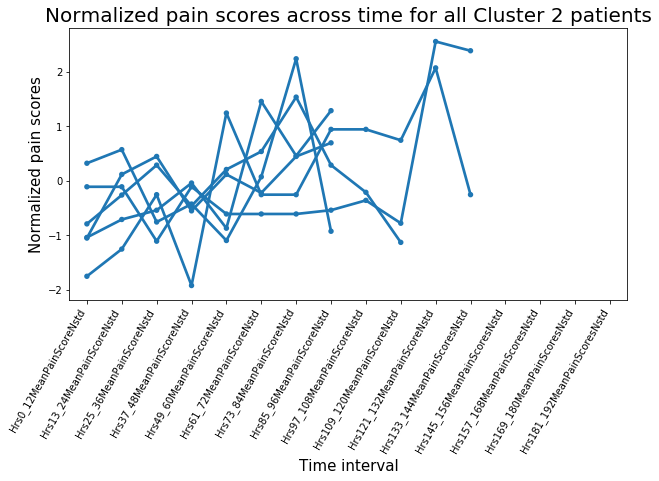

In [141]:
plt.figure(figsize = (10,5))
for i, (name, row) in enumerate(cluster2.iterrows()):
    sb.pointplot(list(cluster1.columns), row, order = list(cluster1.columns), markers = '.')
    plt.xticks(rotation = 60, ha='right')
    plt.title("Normalized pain scores across time for all Cluster 2 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

Text(0.5,0,'Time interval')

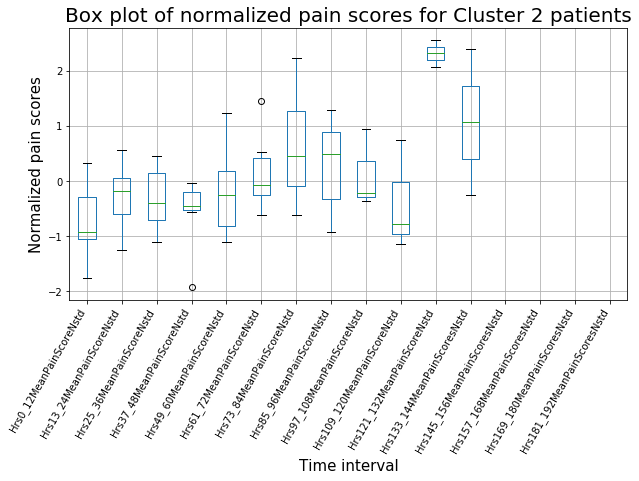

In [142]:
plt.figure(figsize = (10,5))
cluster2.boxplot()
plt.xticks(rotation = 60, ha='right')
plt.title("Box plot of normalized pain scores for Cluster 2 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

## Cluster 3 pain plot

C:\Applications\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0.5,0,'Time interval')

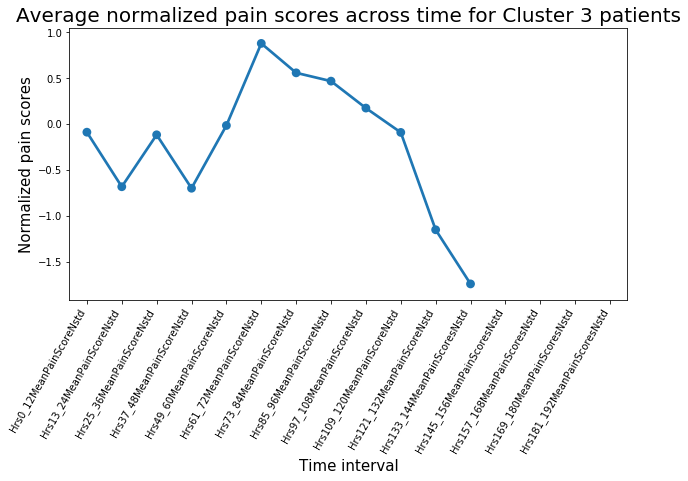

In [143]:
cluster3 = cluster3[standardized_cols]
plt.figure(figsize = (10,5))
sb.pointplot(list(cluster3.columns), [cluster3[rng].sum()/cluster3[rng].count() for rng in list(cluster3.columns)], order = list(cluster3.columns))
plt.xticks(rotation = 60, ha='right')
plt.title("Average normalized pain scores across time for Cluster 3 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

Text(0.5,0,'Time interval')

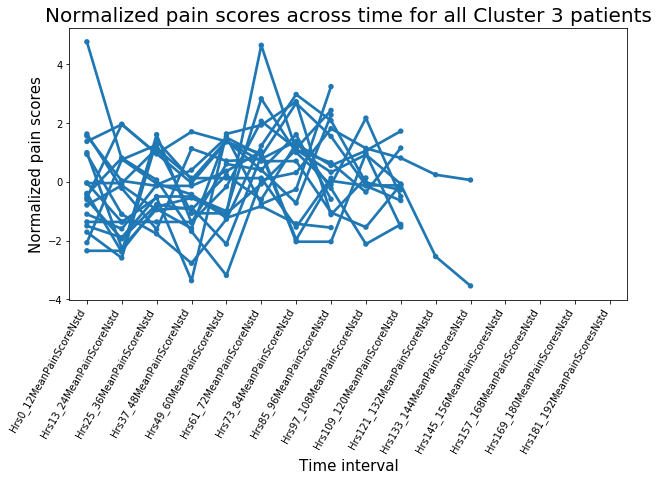

In [144]:
plt.figure(figsize = (10,5))
for i, (name, row) in enumerate(cluster3.iterrows()):
    sb.pointplot(list(cluster1.columns), row, order = list(cluster1.columns), markers = '.')
    plt.xticks(rotation = 60, ha='right')
plt.title("Normalized pain scores across time for all Cluster 3 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

Text(0.5,0,'Time interval')

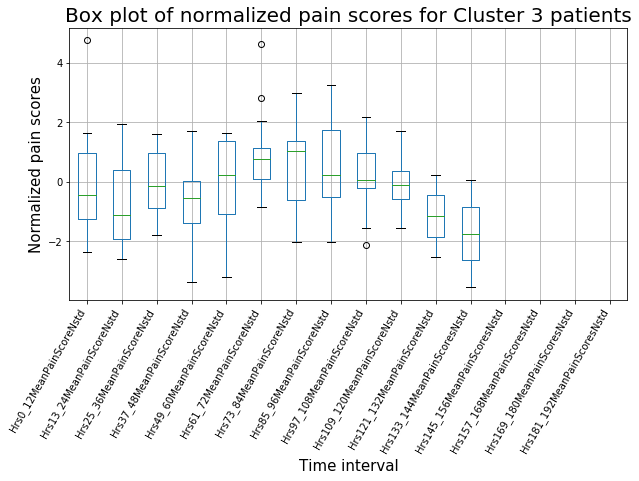

In [145]:
plt.figure(figsize = (10,5))
cluster3.boxplot()
plt.xticks(rotation = 60, ha='right')
plt.title("Box plot of normalized pain scores for Cluster 3 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

## Cluster 1: Seemingly random trends, fluctuates
## Cluster 2: Pain increases over time
## Cluster 3: Pain decreases over time

## Cluster 1: Very low Risser, low end of age, mostly white
## Cluster 2: Highest age and weight, low bottom level, high shape, high top degree
## Cluster 3: Very low Risser, middle of age, mostly had surgery before

# Clustering for chest data

In [30]:
spine_df.rename(columns = {
    'GroupingInclusions (1 include, 2 exclude)':'Grouping',
    'Genetics (1 yes, 2=NO)':'Genetics',
    'WhatSurgery (1=Nuss, 2= Spine, 3=other)':'WhatSurgery',
    'Top level (0-7 Cervical, 8-19 thoracic, 20-24-lumbar, 999 not applicable)':'Top level',
    'Bottom level (0-7 Cervical, 8-19 thoracic, 20-24-lumbar, 999 not applicable)':'Bottom level',
    'Shape (1=Rt-left S, 2=left-right, 3= kyphosis; 999=not applicable)':'Shape',
}, inplace=True)
chest_df.rename(columns = {
    'GroupingInclusions (1 include, 2 exclude)':'Grouping',
    'Genetics (1 yes, 2=NO)':'Genetics',
    'WhatSurgery (1=Nuss, 2= Spine, 3=other)':'WhatSurgery',
    'Top level (0-7 Cervical, 8-19 thoracic, 20-24-lumbar, 999 not applicable)':'Top level',
    'Bottom level (0-7 Cervical, 8-19 thoracic, 20-24-lumbar, 999 not applicable)':'Bottom level',
    'Shape (1=Rt-left S, 2=left-right, 3= kyphosis; 999=not applicable)':'Shape',
}, inplace=True)

/Users/eileenzyf/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:3781: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


In [31]:
spine_df.head()

,Grouping,Genetics,PatientGender,PatientAge,PatientWeight,PatientRace,WhatSurgery,Haller Index (999= not applicable),Risser,Top level,Bottom level,# of levels,Shape,Top degree,Bottom degree,SurgeryHX,Surgeries,DischargeDate,DODPostOpDay,PostOpHrs,PhoneFollowUpDate,PFUPostOpDay,ASA,Surgeon,PACUManagement = (0=picu; PACU morphine equivalents=PACU; PACU nothing - 0.01; Benadryl9+dose),"ComplementaryTherapies (0=none, 1=guided imagery, 2=massage, 3=guided imagry and massage)",ParentAge,ParentGender,ParentRace,Relationship,PatientPredictive,ParentPredictive,Hrs0_12MeanPainScore,Hrs13_24MeanPainScore,Hrs25_36MeanPainScore,Hrs37_48MeanPainScore,Hrs49_60MeanPainScore,Hrs61_72MeanPainScore,Hrs73_84MeanPainScore,Hrs85_96MeanPainScore,Hrs97_108MeanPainScore,Hrs109_120MeanPainScore,Hrs121_132MeanPainScore,Hrs133_144MeanPainScores,Hrs145_156MeanPainScores,Hrs157_168MeanPainScores,Hrs169_180MeanPainScores,Hrs181_192MeanPainScores,Mean,POD1APPTVAS,POD2APPTVAS,POD3APPTVAS,POD4APPTVAS,POD5APPTVAS,POD6APPTVAS,POD7APPTVAS,POD8APPTVAS,PDHomeAPPTVAS,PDClinic1APPTVAS,PDClinic2APPTVAS,PDClinic3APPTVAS,PDClinic4APPTVAS,PDClinic5APPTVAS,MeanVAS,PainDiff,Hrs0_12MeanPainScoreVASstd,Hrs0_12MeanPainScoreNstd,Hrs13_24MeanPainScoreVASstd,Hrs13_24MeanPainScoreNstd,Hrs25_36MeanPainScoreVASstd,Hrs25_36MeanPainScoreNstd,Hrs37_48MeanPainScoreVASstd,Hrs37_48MeanPainScoreNstd,Hrs49_60MeanPainScoreVASstd,Hrs49_60MeanPainScoreNstd,Hrs61_72MeanPainScoreVASstd,Hrs61_72MeanPainScoreNstd,Hrs73_84MeanPainScoreVASstd,Hrs73_84MeanPainScoreNstd,Hrs85_96MeanPainScoreVASstd,Hrs85_96MeanPainScoreNstd,Hrs97_108MeanPainScoreVASstd,Hrs97_108MeanPainScoreNstd,Hrs109_120MeanPainScoreVASstd,Hrs109_120MeanPainScoreNstd,Hrs121_132MeanPainScoreVASstd,Hrs121_132MeanPainScoreNstd,Hrs133_144MeanPainScoresVASstd,Hrs133_144MeanPainScoresNstd,Hrs145_156MeanPainScoresVASstd,Hrs145_156MeanPainScoresNstd,Hrs157_168MeanPainScoresVASstd,Hrs157_168MeanPainScoresNstd,Hrs169_180MeanPainScoresVASstd,Hrs169_180MeanPainScoresNstd,Hrs181_192MeanPainScoresVASstd,Hrs181_192MeanPainScoresNstd
PatientID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
504,1,1,2,137,63.0,1,2,999.0,777.0,11,22.0,11,1.0,51.0,42.0,0,999,2014-03-27 00:00:00,6.0,137.0,2014-03-21 00:00:00,11.0,2,1,777.00,0,460,2,1,1,70.0,100,5.50,4.00,4.67,4.67,5.40,5.13,5.50,4.00,5.0,6.2,6.0,6.0,NaN,NaN,NaN,NaN,5.17250,36.08,NaN,52.58,NaN,NaN,NaN,NaN,NaN,NaN,7.22,NaN,NaN,NaN,NaN,3.196000,1.976500,3.523500,0.32750,2.023500,-1.17250,2.693500,-0.50250,2.693500,-0.50250,3.423500,0.22750,3.153500,-0.04250,3.523500,0.32750,2.023500,-1.17250,3.023500,-0.1725,4.223500,1.0275,4.0235,0.8275,4.0235,0.8275,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
508,1,1,1,234,57.7,1,2,999.0,5.0,10,21.0,11,3.0,89.0,999.0,0,999,2014-05-23 00:00:00,4.0,93.0,2014-05-30 00:00:00,11.0,2,2,0.01,0,504,2,1,1,70.0,100,2.50,3.67,4.00,3.00,3.67,3.33,4.00,4.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.55250,51.55,49.48,41.24,38.14,NaN,NaN,NaN,NaN,22.68,NaN,22.68,NaN,8.0,NaN,3.339571,0.212929,2.287071,-1.05250,3.457071,0.11750,3.787071,0.44750,2.787071,-0.55250,3.457071,0.11750,3.117071,-0.22250,3.787071,0.44750,4.037071,0.69750,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
509,1,1,2,158,40.0,1,2,999.0,777.0,11,21.0,10,777.0,40.0,23.0,0,999,2014-06-28 00:00:00,4.0,100.0,2014-07-03 00:00:00,9.0,2,1,0.01,0,542,2,1,1,80.0,90,4.83,4.83,6.00,5.00,5.00,5.00,3.33,5.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.87375,43.30,67.01,51.55,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.395333,-0.521583,5.351583,-0.04375,5.351583,-0.04375,6.521583,1.12625,5.521583,0.12625,5.521583,0.12625,5.521583,0.12625,3.851583,-1.54375,5.521583,0.12625,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
510,1,1,2,177,58.0,1,2,999.0,4.0,11,22.0,11,1.0,67.0,59.0,0,999,2014-07-08 00:00:00,5.0,110.0,2014-07-15 00:00:00,12.0,1,1,0.01,0,560,2,1,1,60.0,70,5.00,4.33,3.50,4.33,4.50,5.50,6.00,4.00,4.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN,4.71600,68.04,64.95,64.95,64.95,NaN,NaN,NaN,N

In [32]:
chest_df.head()

,Grouping,Genetics,PatientGender,PatientAge,PatientWeight,PatientRace,WhatSurgery,Haller Index (999= not applicable),Risser,Top level,Bottom level,# of levels,Shape,Top degree,Bottom degree,SurgeryHX,Surgeries,DischargeDate,DODPostOpDay,PostOpHrs,PhoneFollowUpDate,PFUPostOpDay,ASA,Surgeon,PACUManagement = (0=picu; PACU morphine equivalents=PACU; PACU nothing - 0.01; Benadryl9+dose),"ComplementaryTherapies (0=none, 1=guided imagery, 2=massage, 3=guided imagry and massage)",ParentAge,ParentGender,ParentRace,Relationship,PatientPredictive,ParentPredictive,Hrs0_12MeanPainScore,Hrs13_24MeanPainScore,Hrs25_36MeanPainScore,Hrs37_48MeanPainScore,Hrs49_60MeanPainScore,Hrs61_72MeanPainScore,Hrs73_84MeanPainScore,Hrs85_96MeanPainScore,Hrs97_108MeanPainScore,Hrs109_120MeanPainScore,Hrs121_132MeanPainScore,Hrs133_144MeanPainScores,Hrs145_156MeanPainScores,Hrs157_168MeanPainScores,Hrs169_180MeanPainScores,Hrs181_192MeanPainScores,Mean,POD1APPTVAS,POD2APPTVAS,POD3APPTVAS,POD4APPTVAS,POD5APPTVAS,POD6APPTVAS,POD7APPTVAS,POD8APPTVAS,PDHomeAPPTVAS,PDClinic1APPTVAS,PDClinic2APPTVAS,PDClinic3APPTVAS,PDClinic4APPTVAS,PDClinic5APPTVAS,MeanVAS,PainDiff,Hrs0_12MeanPainScoreVASstd,Hrs0_12MeanPainScoreNstd,Hrs13_24MeanPainScoreVASstd,Hrs13_24MeanPainScoreNstd,Hrs25_36MeanPainScoreVASstd,Hrs25_36MeanPainScoreNstd,Hrs37_48MeanPainScoreVASstd,Hrs37_48MeanPainScoreNstd,Hrs49_60MeanPainScoreVASstd,Hrs49_60MeanPainScoreNstd,Hrs61_72MeanPainScoreVASstd,Hrs61_72MeanPainScoreNstd,Hrs73_84MeanPainScoreVASstd,Hrs73_84MeanPainScoreNstd,Hrs85_96MeanPainScoreVASstd,Hrs85_96MeanPainScoreNstd,Hrs97_108MeanPainScoreVASstd,Hrs97_108MeanPainScoreNstd,Hrs109_120MeanPainScoreVASstd,Hrs109_120MeanPainScoreNstd,Hrs121_132MeanPainScoreVASstd,Hrs121_132MeanPainScoreNstd,Hrs133_144MeanPainScoresVASstd,Hrs133_144MeanPainScoresNstd,Hrs145_156MeanPainScoresVASstd,Hrs145_156MeanPainScoresNstd,Hrs157_168MeanPainScoresVASstd,Hrs157_168MeanPainScoresNstd,Hrs169_180MeanPainScoresVASstd,Hrs169_180MeanPainScoresNstd,Hrs181_192MeanPainScoresVASstd,Hrs181_192MeanPainScoresNstd
PatientID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
501,1,1,1,194,65.0,1,1,3.90,999.0,999,999.0,999,999.0,999.0,999.0,0,999,2013-12-24 00:00:00,8.0,189.00,2013-12-30 00:00:00,14.0,1,6,777.000,0,777,1,1,2,90.0,90,7.67,7.83,7.21,7.20,7.50,6.33,5.71,7.25,7.50,5.83,5.5,6.0,7.0,6.5,4.5,7.0,6.658125,73.20,65.98,NaN,NaN,NaN,NaN,68.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.907333,-0.249208,7.919208,1.011875,8.079208,1.171875,7.459208,0.551875,7.449208,0.541875,7.749208,0.841875,6.579208,-0.328125,5.959208,-0.948125,7.499208,0.591875,7.749208,0.841875,6.079208,-0.828125,5.749208,-1.158125,6.249208,-0.658125,7.249208,0.341875,6.749208,-0.158125,4.749208,-2.158125,7.249208,0.341875
502,1,1,1,179,57.0,1,1,3.86,999.0,999,999.0,999,999.0,999.0,99.0,0,999,2013-12-22 00:00:00,4.0,93.50,2013-12-22 00:00:00,12.0,2,3,777.000,1,777,2,1,1,777.0,777,4.00,4.33,3.67,3.50,4.00,3.67,1.50,3.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.458750,45.36,29.90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.43,NaN,NaN,2.989667,0.469083,3.530917,0.541250,3.860917,0.871250,3.200917,0.211250,3.030917,0.041250,3.530917,0.541250,3.200917,0.211250,1.030917,-1.958750,2.530917,-0.458750,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
503,1,1,1,185,68.0,1,1,3.90,999.0,999,999.0,999,999.0,999.0,999.0,1,Reconstructive Surgeries on middle finger of l...,2014-03-28 00:00:00,4.0,96.00,2014-03-31 00:00:00,7.0,1,4,9.338,1,679,1,1,2,80.0,80,5.50,1.00,3.75,5.25,4.33,3.33,5.42,4.33,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.113750,36.08,38.14,37.11,72.16,NaN,NaN,NaN,NaN,NaN,35.05,22.68,NaN,NaN,NaN,4.020333,0.093417,5.406583,1.386250,0.906583,-3.113750,3.656583,-0.363750,5.156583,1.136250,4.236583,0.216250,3.236583,-0.783750,5.326583,1.306250,4.236583,0.216250,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
505,1,1,1,180,66.0,1,1,3.10,999.0,999,999.0,999,999.0,999.0,999.0,0,999,2014-05-12 00:00:00,5.0,113.75,2014-05-16 

In [33]:
from sklearn.cluster import KMeans

In [34]:
# Pain scores not part of clustering by patient characteristics for chest patients.
chest_df_features = chest_df[chest_df.columns[:-81]]
#drop spine related variables
chest_df_features = chest_df_features.drop(["Risser", "Top level", "Bottom level", "# of levels", "Shape", "Top degree ","Bottom degree"], axis = 1)

#what type of surgery not applicable so dropped.
chest_df_features = chest_df_features.drop('WhatSurgery', axis=1)

In [35]:

#spine_df_features['Haller_categories'] = pd.cut(spine_df_features['Haller Index (999= not applicable)'],[-1,7,19,24,999],labels=[1,2,3,4])


In [36]:
model3 = KMeans(n_clusters=3)
model3.fit(chest_df_features)
labels3 = model3.predict(chest_df_features)
cents3 = model3.cluster_centers_

In [37]:
cents3

array([[  1.        ,   1.11111111,   1.33333333, 166.11111111,
         51.2       ,   2.44444444,   4.13333333,   0.33333333],
       [  1.        ,   1.        ,   1.        , 218.5       ,
         65.05      ,   2.25      ,   4.695     ,   0.5       ],
       [  1.        ,   1.        ,   1.        , 182.27272727,
         62.03636364,   1.27272727,   4.24181818,   0.27272727]])

In [38]:
labels3


array([2, 2, 2, 2, 0, 0, 2, 1, 1, 2, 2, 0, 2, 2, 0, 0, 2, 1, 0, 0, 0, 2,
       0, 1], dtype=int32)

In [39]:
model4 = KMeans(n_clusters=4)
model4.fit(chest_df_features)
labels4 = model4.predict(chest_df_features)
cents4 = model4.cluster_centers_

In [40]:
model5 = KMeans(n_clusters=5)
model5.fit(chest_df_features)
labels5 = model5.predict(chest_df_features)
cents5 = model5.cluster_centers_

In [41]:
cents5

array([[  1.        ,   1.14285714,   1.42857143, 165.85714286,
         47.98571429,   2.14285714,   4.1       ,   0.42857143],
       [  1.        ,   1.        ,   1.        , 231.        ,
         66.6       ,   1.        ,   4.64      ,   1.        ],
       [  1.        ,   1.        ,   1.        , 200.25      ,
         64.4       ,   2.25      ,   4.4       ,   0.        ],
       [  1.        ,   1.        ,   1.        , 180.33333333,
         58.82222222,   1.88888889,   4.40666667,   0.33333333],
       [  1.        ,   1.        ,   1.        , 163.5       ,
         73.65      ,   1.        ,   3.7       ,   0.        ]])

In [42]:
chest_df_labels = chest_df_features.copy()
chest_df_labels['kmeans3_label'] = labels3

chest_df_labels['kmeans5_label'] = labels5

Text(0.5,1,'Correlations across features for chest surgery patients')

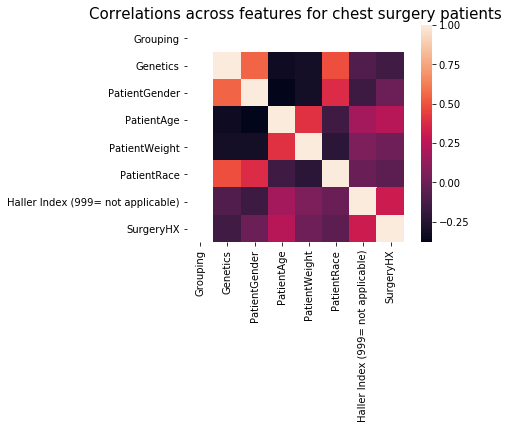

In [43]:
ax = plt.axes()
sb.heatmap(chest_df_features.corr(), square=True)
ax.set_title('Correlations across features for chest surgery patients', size=15)

In [44]:
chest_df_labels

,Grouping,Genetics,PatientGender,PatientAge,PatientWeight,PatientRace,Haller Index (999= not applicable),SurgeryHX,kmeans3_label,kmeans5_label
PatientID,,,,,,,,,,
501,1,1,1,194,65.0,1,3.90,0,2,2
502,1,1,1,179,57.0,1,3.86,0,2,3
503,1,1,1,185,68.0,1,3.90,1,2,3
505,1,1,1,180,66.0,1,3.10,0,2,3
507,1,1,1,167,55.0,1,5.90,1,0,0
518,1,1,1,170,38.0,1,3.20,1,0,0
521,1,1,1,178,53.0,1,5.50,0,2,3
522,1,1,1,225,71.5,1,3.98,1,1,1
524,1,1,1,237,61.7,1,5.30,1,1,1


Cluster 0 Grouping: Included Genetics: Yes Gender: mostly Male Age: 181.917 Weight: 60.983 Race: mostly White Haller Index: 4.222 Surgery HX: 0.25 (more likely not to have had surgery)

Cluster 1 Grouping: Included Genetics: Yes Gender: Male Age: 218.5 Weight: 65.05 Race: White with one mixed Haller Index: 3.62 Surgery HX: 0.5 (equal probability)

Cluster 2 Grouping: Included Genetics: Yes Gender: Male and Female, leaning Male Age: 164.625 Weight: 51.425 Race: Mostly White Haller Index: 4.15 Surgery HX: 0.375 (likely not to have had surgery)


Text(0.5,1,'K Means with k=3')

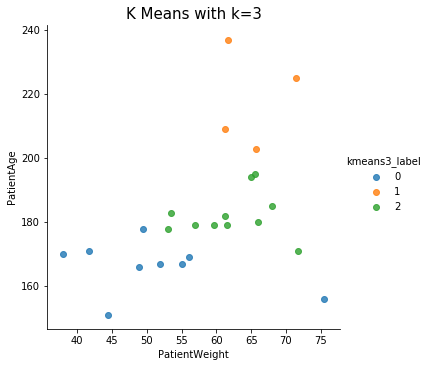

In [45]:
facet = sb.lmplot(data=chest_df_labels, x='PatientWeight', y='PatientAge', hue='kmeans3_label', 
                   fit_reg=False, legend=True, legend_out=True)
axes = facet.axes.flatten()
axes[0].set_title('K Means with k=3', size = 15)

Text(0.5,1,'K Means with k=5')

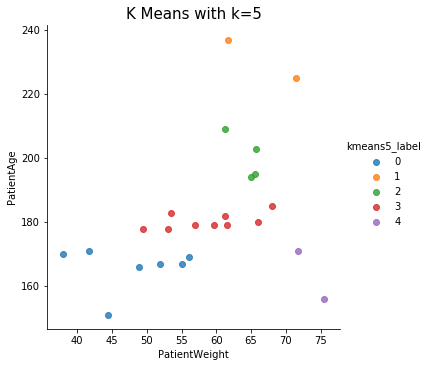

In [46]:
facet = sb.lmplot(data=chest_df_labels, x='PatientWeight', y='PatientAge', hue='kmeans5_label', 
                   fit_reg=False, legend=True, legend_out=True)
axes = facet.axes.flatten()
axes[0].set_title('K Means with k=5', size = 15)

Text(0.5,1,'Correlations across features for 3 clusters')

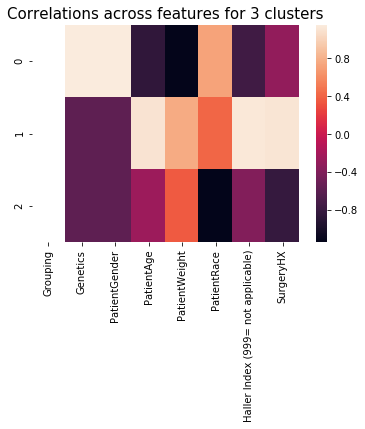

In [47]:
kmeans3_df = pd.DataFrame(cents3, columns = chest_df_features.columns)
kmeans3_df_norm = (kmeans3_df - kmeans3_df.mean())/kmeans3_df.std()
ax = plt.axes()
sb.heatmap(kmeans3_df_norm)
ax.set_title('Correlations across features for 3 clusters', size=15)

Text(0.5,1,'Correlations across features for 5 clusters')

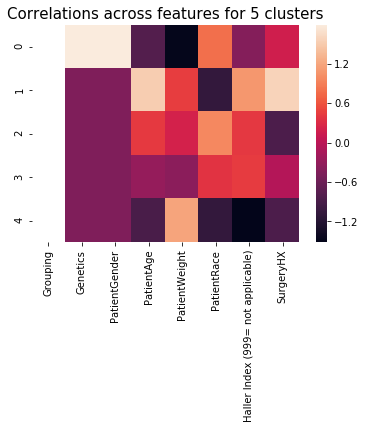

In [48]:
kmeans5_df = pd.DataFrame(cents5, columns = chest_df_features.columns)
kmeans5_df_norm = (kmeans5_df - kmeans5_df.mean())/kmeans5_df.std()
ax = plt.axes()
sb.heatmap(kmeans5_df_norm)
ax.set_title('Correlations across features for 5 clusters', size=15)

# PCA Plotting

In [49]:
# normalizing the feature set
chest_df_features_norm = (chest_df_features - chest_df_features.mean())/chest_df_features.std()
chest_df_features_norm = chest_df_features_norm.drop("Grouping", axis = 1)

In [50]:
from sklearn.decomposition import PCA as sklearnPCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

In [51]:
pca = sklearnPCA(n_components=2)
transformed_chest = pd.DataFrame(pca.fit_transform(chest_df_features_norm))

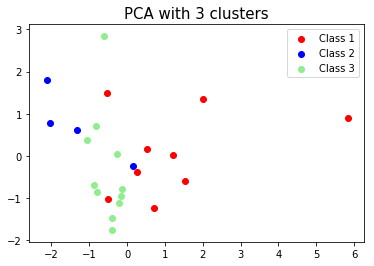

In [52]:
plt.scatter(transformed_chest[labels3==0][0], transformed_chest[labels3==0][1], label='Class 1', c='red')
plt.scatter(transformed_chest[labels3==1][0], transformed_chest[labels3==1][1], label='Class 2', c='blue')
plt.scatter(transformed_chest[labels3==2][0], transformed_chest[labels3==2][1], label='Class 3', c='lightgreen')
plt.title('PCA with 3 clusters', size = 15)
plt.legend()
plt.show()

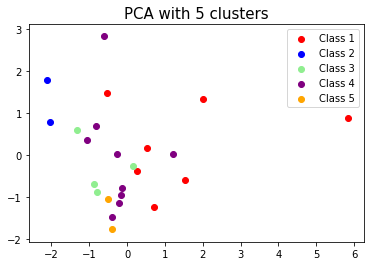

In [53]:
plt.scatter(transformed_chest[labels5==0][0], transformed_chest[labels5==0][1], label='Class 1', c='red')
plt.scatter(transformed_chest[labels5==1][0], transformed_chest[labels5==1][1], label='Class 2', c='blue')
plt.scatter(transformed_chest[labels5==2][0], transformed_chest[labels5==2][1], label='Class 3', c='lightgreen')
plt.scatter(transformed_chest[labels5==3][0], transformed_chest[labels5==3][1], label='Class 4', c='purple')
plt.scatter(transformed_chest[labels5==4][0], transformed_chest[labels5==4][1], label='Class 5', c='orange')
plt.title('PCA with 5 clusters', size = 15)
plt.legend()
plt.show()

In [54]:
model3_pca = KMeans(n_clusters=3)
model3_pca.fit(transformed_chest)
labels3_pca = model3_pca.predict(transformed_chest)
cents3_pca = model3_pca.cluster_centers_

model4_pca = KMeans(n_clusters=4)
model4_pca.fit(transformed_chest)
labels4_pca = model4_pca.predict(transformed_chest)
cents4_pca = model4_pca.cluster_centers_

model5_pca = KMeans(n_clusters=5)
model5_pca.fit(transformed_chest)
labels5_pca = model5_pca.predict(transformed_chest)
cents5_pca = model5_pca.cluster_centers_

In [55]:
sum(labels3_pca == labels3)/len(labels3)
sum(labels4_pca == labels4)/len(labels4)
sum(labels5_pca == labels5)/len(labels5)

0.125

In [56]:
#model3_pca.labels_
labels3_final = np.concatenate((labels3_pca[1:21], labels3_pca[23]), axis = None)
labels3_final 

array([0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
      dtype=int32)

Text(0.5,1,'K Means with k=3')

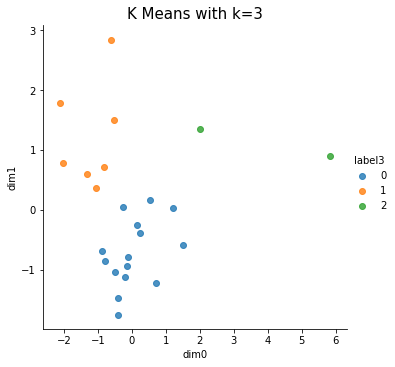

In [57]:
labels_transformed = transformed_chest.copy()
labels_transformed.columns = ['dim0','dim1']
labels_transformed['label3'] = labels3_pca
labels_transformed['label4'] = labels4_pca
labels_transformed['label5'] = labels5_pca
facet = sb.lmplot(data=labels_transformed, x='dim0', y='dim1', hue='label3', 
                   fit_reg=False, legend=True, legend_out=True)
axes = facet.axes.flatten()
axes[0].set_title('K Means with k=3', size = 15)

Text(0.5,1,'K Means with k=4')

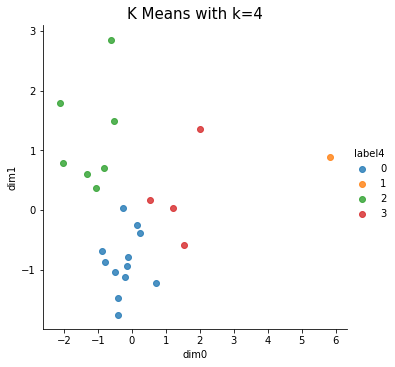

In [58]:
labels_transformed = transformed_chest.copy()
labels_transformed.columns = ['dim0','dim1']
labels_transformed['label3'] = labels3_pca
labels_transformed['label4'] = labels4_pca
labels_transformed['label5'] = labels5_pca
facet = sb.lmplot(data=labels_transformed, x='dim0', y='dim1', hue='label4', 
                   fit_reg=False, legend=True, legend_out=True)
axes = facet.axes.flatten()
axes[0].set_title('K Means with k=4', size = 15)

In [59]:
from scipy.spatial.distance import cdist,pdist
from scipy.cluster.vq import kmeans
from matplotlib.pyplot import cm


Text(0.5,1,'Elbow for KMeans clustering')

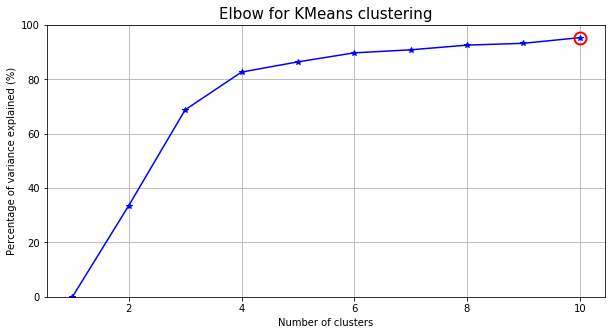

In [60]:
# Selection process for number of folds.
# Just enough folds to explain up to 80% of the variance.
kmax = 10
krange = range(1, kmax+1)

km = [kmeans(transformed_chest, k) for k in krange]
centroids = [cent for (cent, var) in km]
distances_k = [cdist(transformed_chest, cent, 'euclidean') for cent in centroids]
cIdx = [np.argmin(D,axis=1) for D in distances_k]
dist = [np.min(D,axis=1) for D in distances_k]

tot_withinss = [sum(d**2) for d in dist]  # Total within-cluster sum of squares
totss = sum(pdist(transformed_chest)**2)/transformed_chest.shape[0]       # The total sum of squares
betweenss = totss - tot_withinss          # The between-cluster sum of squares

##### plots #####
kIdx = 9        # K=10
clr = cm.Spectral( np.linspace(0,1,10) ).tolist()
mrk = 'os^p<dvh8>+x.'

# elbow curve
fig = plt.figure(figsize = (10,5))
ax = fig.add_subplot(111)
ax.plot(krange, betweenss/totss*100, 'b*-')
ax.plot(krange[kIdx], betweenss[kIdx]/totss*100, marker='o', markersize=12, 
    markeredgewidth=2, markeredgecolor='r', markerfacecolor='None')
ax.set_ylim((0,100))
plt.grid(True)
plt.xlabel('Number of clusters')
plt.ylabel('Percentage of variance explained (%)')
plt.title('Elbow for KMeans clustering', size=15)

The elbow curve shows that 4 cluters would be the optimal choice, however, whenn plotted out, we can see that there is a outlier, so we decided to only look at the rest three clusters

In [68]:
labels4_pca_final = np.concatenate((labels4_pca[:22], labels4_pca[23]), axis = None)
labels4_pca_final

array([0, 0, 2, 0, 2, 3, 0, 2, 2, 2, 2, 3, 0, 0, 3, 3, 0, 0, 0, 0, 0, 0,
       2], dtype=int32)

In [75]:
chest_df_labels['kmeans4_pca_label'] = labels4_pca
chest_df_labels

,Grouping,Genetics,PatientGender,PatientAge,PatientWeight,PatientRace,Haller Index (999= not applicable),SurgeryHX,kmeans3_label,kmeans5_label,kmeans4_pca_label
PatientID,,,,,,,,,,,
501,1,1,1,194,65.0,1,3.90,0,2,2,0
502,1,1,1,179,57.0,1,3.86,0,2,3,0
503,1,1,1,185,68.0,1,3.90,1,2,3,2
505,1,1,1,180,66.0,1,3.10,0,2,3,0
507,1,1,1,167,55.0,1,5.90,1,0,0,2
518,1,1,1,170,38.0,1,3.20,1,0,0,3
521,1,1,1,178,53.0,1,5.50,0,2,3,0
522,1,1,1,225,71.5,1,3.98,1,1,1,2
524,1,1,1,237,61.7,1,5.30,1,1,1,2


# Parallel coordinates trendlines

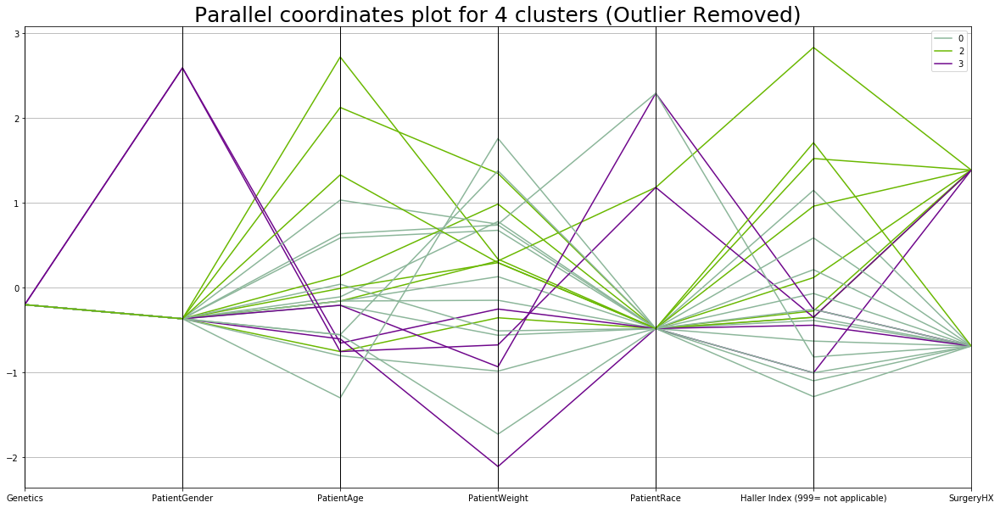

In [78]:
# Trendline changes across clusters for all variables.
plt.figure(figsize=(20,10))
plot_feats_all = list(chest_df_features_norm.columns)
data_norm_all = chest_df_features_norm.copy()[plot_feats_all]
data_norm_all.drop([568],0, inplace = True)

data_norm_all['kmeans4_pca_label'] = labels4_pca_final

parallel_coordinates(data_norm_all, 'kmeans4_pca_label')
plt.title("Parallel coordinates plot for 4 clusters (Outlier Removed)", size = 25)
plt.show()

In [74]:
data_norm_all

,Genetics,PatientGender,PatientAge,PatientWeight,PatientRace,Haller Index (999= not applicable),SurgeryHX,kmeans4_pca_label
PatientID,,,,,,,,
501,-0.204124,-0.370006,0.583502,0.673616,-0.485769,-0.352761,-0.692219,0
502,-0.204124,-0.370006,-0.161394,-0.152273,-0.485769,-0.390222,-0.692219,0
503,-0.204124,-0.370006,0.136564,0.983324,-0.485769,-0.352761,1.384437,2
505,-0.204124,-0.370006,-0.111734,0.776852,-0.485769,-1.101988,-0.692219,0
507,-0.204124,-0.370006,-0.757311,-0.358746,-0.485769,1.520306,1.384437,2
518,-0.204124,-0.370006,-0.608332,-2.113759,-0.485769,-1.008334,1.384437,3
521,-0.204124,-0.370006,-0.211054,-0.565218,-0.485769,1.145693,-0.692219,0
522,-0.204124,-0.370006,2.122955,1.344650,-0.485769,-0.277838,1.384437,2
524,-0.204124,-0.370006,2.718872,0.332936,-0.485769,0.958386,1.384437,2


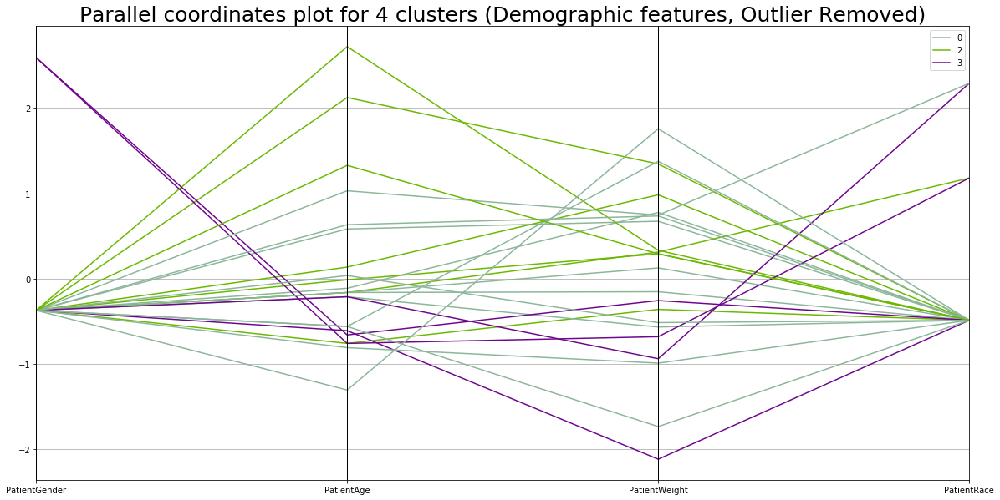

In [80]:
# Trendline changes across clusters for demographic variables.
plt.figure(figsize=(20,10))
plot_feats1 = ['PatientGender', 'PatientAge', 'PatientWeight', 'PatientRace']
data_norm_dem = chest_df_features_norm.copy()[plot_feats1]
data_norm_dem.drop([568],0, inplace = True)
data_norm_dem['kmeans4_pca_label'] = labels4_pca_final

parallel_coordinates(data_norm_dem, 'kmeans4_pca_label')
plt.title("Parallel coordinates plot for 4 clusters (Demographic features, Outlier Removed)", size = 25)
plt.show()

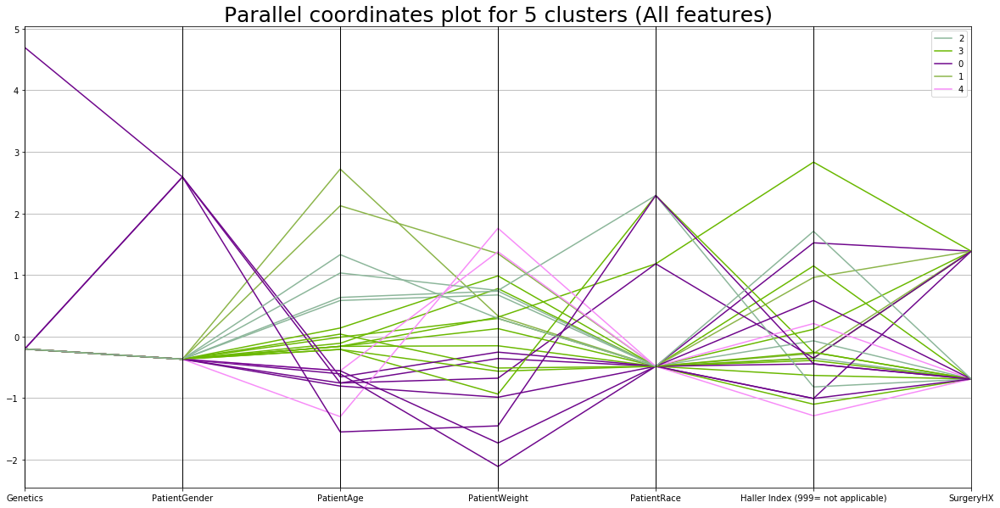

In [81]:
# FOR FIVE CLUSTERS
# Trendline changes across clusters for all variables.
plt.figure(figsize=(20,10))
plot_feats_all = list(chest_df_features_norm.columns)
data_norm_all = chest_df_features_norm.copy()[plot_feats_all]
data_norm_all['kmeans5_label'] = labels5
plt.title("Parallel coordinates plot for 5 clusters (All features)", size = 25)
parallel_coordinates(data_norm_all, 'kmeans5_label')
plt.show()


# Separating original dataframe by patient ID's using 3 clusters¶

In [82]:
chest_df['kmeans4_pca'] = labels4_pca
cluster1 = chest_df[chest_df['kmeans4_pca'] == 0]
cluster2 = chest_df[chest_df['kmeans4_pca'] == 1]
cluster3 = chest_df[chest_df['kmeans4_pca'] == 2]
cluster4 = chest_df[chest_df['kmeans4_pca'] == 3]


/Users/eileenzyf/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [83]:
standardized_cols = ['Hrs0_12MeanPainScoreNstd',
       'Hrs13_24MeanPainScoreNstd',
       'Hrs25_36MeanPainScoreNstd',
       'Hrs37_48MeanPainScoreNstd',
       'Hrs49_60MeanPainScoreNstd',
       'Hrs61_72MeanPainScoreNstd',
       'Hrs73_84MeanPainScoreNstd',
       'Hrs85_96MeanPainScoreNstd',
       'Hrs97_108MeanPainScoreNstd',
       'Hrs109_120MeanPainScoreNstd',
       'Hrs121_132MeanPainScoreNstd',
       'Hrs133_144MeanPainScoresNstd',
       'Hrs145_156MeanPainScoresNstd',
       'Hrs157_168MeanPainScoresNstd',
       'Hrs169_180MeanPainScoresNstd',
       'Hrs181_192MeanPainScoresNstd']

In [84]:
chest_df

,Grouping,Genetics,PatientGender,PatientAge,PatientWeight,PatientRace,WhatSurgery,Haller Index (999= not applicable),Risser,Top level,Bottom level,# of levels,Shape,Top degree,Bottom degree,SurgeryHX,Surgeries,DischargeDate,DODPostOpDay,PostOpHrs,PhoneFollowUpDate,PFUPostOpDay,ASA,Surgeon,PACUManagement = (0=picu; PACU morphine equivalents=PACU; PACU nothing - 0.01; Benadryl9+dose),"ComplementaryTherapies (0=none, 1=guided imagery, 2=massage, 3=guided imagry and massage)",ParentAge,ParentGender,ParentRace,Relationship,PatientPredictive,ParentPredictive,Hrs0_12MeanPainScore,Hrs13_24MeanPainScore,Hrs25_36MeanPainScore,Hrs37_48MeanPainScore,Hrs49_60MeanPainScore,Hrs61_72MeanPainScore,Hrs73_84MeanPainScore,Hrs85_96MeanPainScore,Hrs97_108MeanPainScore,Hrs109_120MeanPainScore,Hrs121_132MeanPainScore,Hrs133_144MeanPainScores,Hrs145_156MeanPainScores,Hrs157_168MeanPainScores,Hrs169_180MeanPainScores,Hrs181_192MeanPainScores,Mean,POD1APPTVAS,POD2APPTVAS,POD3APPTVAS,POD4APPTVAS,POD5APPTVAS,POD6APPTVAS,POD7APPTVAS,POD8APPTVAS,PDHomeAPPTVAS,PDClinic1APPTVAS,PDClinic2APPTVAS,PDClinic3APPTVAS,PDClinic4APPTVAS,PDClinic5APPTVAS,MeanVAS,PainDiff,Hrs0_12MeanPainScoreVASstd,Hrs0_12MeanPainScoreNstd,Hrs13_24MeanPainScoreVASstd,Hrs13_24MeanPainScoreNstd,Hrs25_36MeanPainScoreVASstd,Hrs25_36MeanPainScoreNstd,Hrs37_48MeanPainScoreVASstd,Hrs37_48MeanPainScoreNstd,Hrs49_60MeanPainScoreVASstd,Hrs49_60MeanPainScoreNstd,Hrs61_72MeanPainScoreVASstd,Hrs61_72MeanPainScoreNstd,Hrs73_84MeanPainScoreVASstd,Hrs73_84MeanPainScoreNstd,Hrs85_96MeanPainScoreVASstd,Hrs85_96MeanPainScoreNstd,Hrs97_108MeanPainScoreVASstd,Hrs97_108MeanPainScoreNstd,Hrs109_120MeanPainScoreVASstd,Hrs109_120MeanPainScoreNstd,Hrs121_132MeanPainScoreVASstd,Hrs121_132MeanPainScoreNstd,Hrs133_144MeanPainScoresVASstd,Hrs133_144MeanPainScoresNstd,Hrs145_156MeanPainScoresVASstd,Hrs145_156MeanPainScoresNstd,Hrs157_168MeanPainScoresVASstd,Hrs157_168MeanPainScoresNstd,Hrs169_180MeanPainScoresVASstd,Hrs169_180MeanPainScoresNstd,Hrs181_192MeanPainScoresVASstd,Hrs181_192MeanPainScoresNstd,kmeans4_pca
PatientID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
501,1,1,1,194,65.0,1,1,3.90,999.0,999,999.0,999,999.0,999.0,999.0,0,999,2013-12-24 00:00:00,8.0,189.00,2013-12-30 00:00:00,14.0,1,6,777.000,0,777,1,1,2,90.0,90,7.67,7.83,7.21,7.20,7.50,6.33,5.71,7.25,7.50,5.83,5.50,6.00,7.00,6.5,4.5,7.0,6.658125,73.20,65.98,NaN,NaN,NaN,NaN,68.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.907333,-0.249208,7.919208,1.011875,8.079208,1.171875,7.459208,0.551875,7.449208,0.541875,7.749208,0.841875,6.579208,-0.328125,5.959208,-0.948125,7.499208,0.591875,7.749208,0.841875,6.079208,-0.828125,5.749208,-1.158125,6.249208,-0.658125,7.249208,0.341875,6.749208,-0.158125,4.749208,-2.158125,7.249208,0.341875,0
502,1,1,1,179,57.0,1,1,3.86,999.0,999,999.0,999,999.0,999.0,99.0,0,999,2013-12-22 00:00:00,4.0,93.50,2013-12-22 00:00:00,12.0,2,3,777.000,1,777,2,1,1,777.0,777,4.00,4.33,3.67,3.50,4.00,3.67,1.50,3.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.458750,45.36,29.90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.43,NaN,NaN,2.989667,0.469083,3.530917,0.541250,3.860917,0.871250,3.200917,0.211250,3.030917,0.041250,3.530917,0.541250,3.200917,0.211250,1.030917,-1.958750,2.530917,-0.458750,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
503,1,1,1,185,68.0,1,1,3.90,999.0,999,999.0,999,999.0,999.0,999.0,1,Reconstructive Surgeries on middle finger of l...,2014-03-28 00:00:00,4.0,96.00,2014-03-31 00:00:00,7.0,1,4,9.338,1,679,1,1,2,80.0,80,5.50,1.00,3.75,5.25,4.33,3.33,5.42,4.33,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.113750,36.08,38.14,37.11,72.16,NaN,NaN,NaN,NaN,NaN,35.05,22.68,NaN,NaN,NaN,4.020333,0.093417,5.406583,1.386250,0.906583,-3.113750,3.656583,-0.363750,5.156583,1.136250,4.236583,0.216250,3.236583,-0.783750,5.326583,1.306250,4.236583,0.216250,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
505,1,1,1,180,66.0,1,1,3.10,999.0,999,999.0,999,999.0,999.0,999.0,0,999,2014-05-12 00:00:00,

# Cluster 1 pain plot

Text(0.5,0,'Time interval')

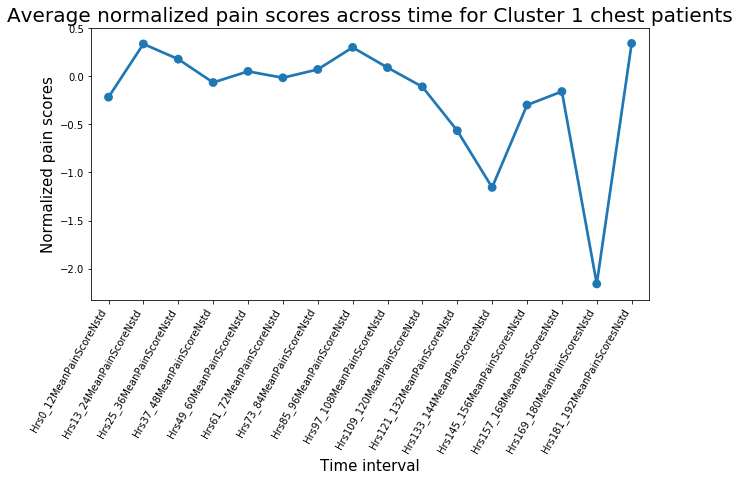

In [85]:
cluster1 = cluster1[standardized_cols]
plt.figure(figsize = (10,5))
sb.pointplot(list(cluster1.columns), [cluster1[rng].sum()/cluster1[rng].count() for rng in list(cluster1.columns)], order = list(cluster1.columns))
plt.xticks(rotation = 60, ha='right')

plt.title("Average normalized pain scores across time for Cluster 1 chest patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

Text(0.5,0,'Time interval')

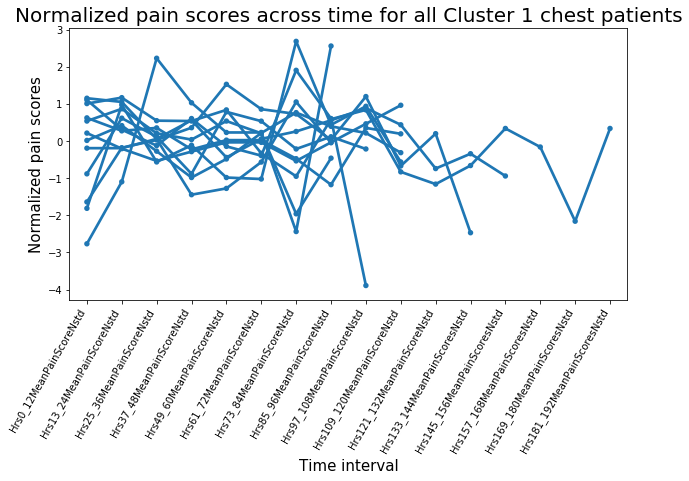

In [86]:
plt.figure(figsize = (10,5))
for i, (name, row) in enumerate(cluster1.iterrows()):
    sb.pointplot(list(cluster1.columns), row, order = list(cluster1.columns), markers = '.')
    plt.xticks(rotation = 60, ha='right')

plt.title("Normalized pain scores across time for all Cluster 1 chest patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

Text(0.5,0,'Time interval')

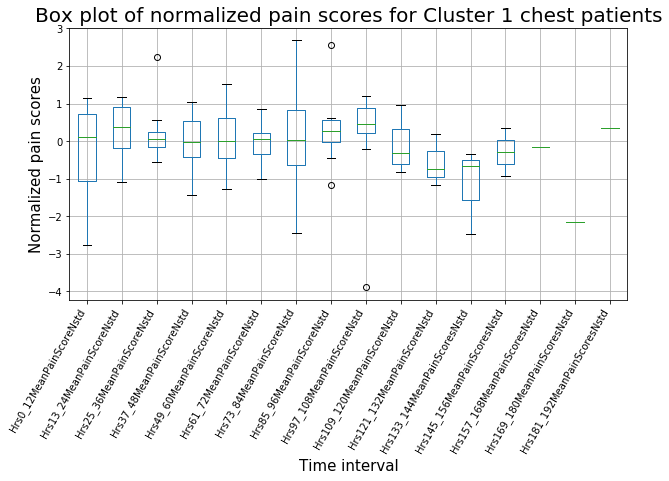

In [87]:
plt.figure(figsize = (10,5))
cluster1.boxplot()
plt.xticks(rotation = 60, ha='right')
plt.title("Box plot of normalized pain scores for Cluster 1 chest patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

# Cluster 2 pain plot

/Users/eileenzyf/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0.5,0,'Time interval')

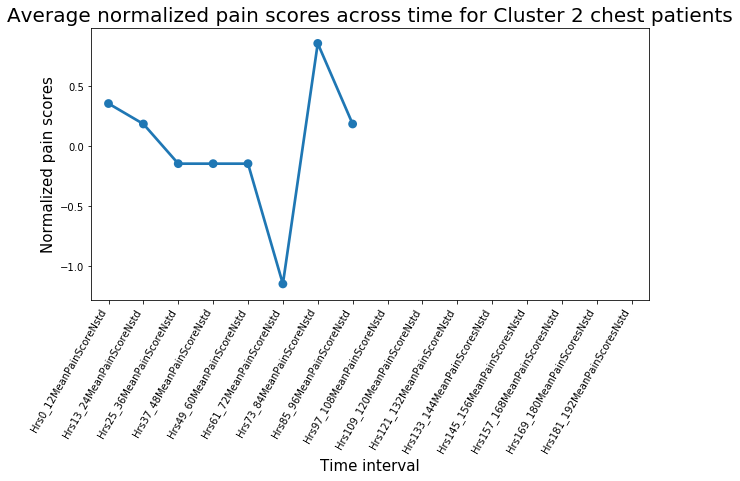

In [88]:
cluster2 = cluster2[standardized_cols]
plt.figure(figsize = (10,5))
sb.pointplot(list(cluster2.columns), [cluster2[rng].sum()/cluster2[rng].count() for rng in list(cluster2.columns)], order = list(cluster2.columns))
plt.xticks(rotation = 60, ha='right')
plt.title("Average normalized pain scores across time for Cluster 2 chest patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

Text(0.5,0,'Time interval')

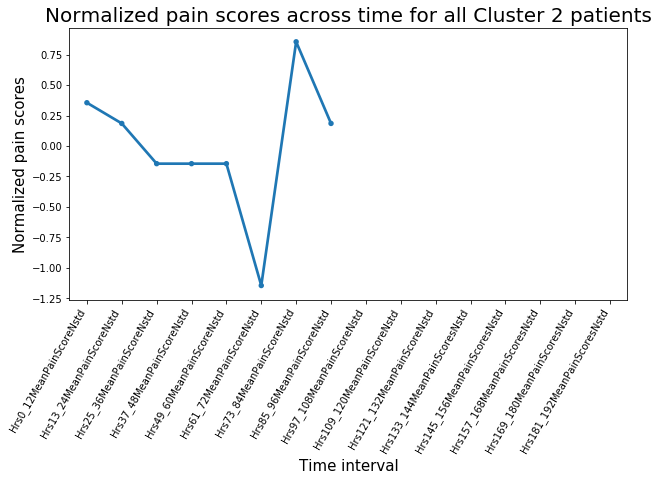

In [89]:
plt.figure(figsize = (10,5))
for i, (name, row) in enumerate(cluster2.iterrows()):
    sb.pointplot(list(cluster1.columns), row, order = list(cluster1.columns), markers = '.')
    plt.xticks(rotation = 60, ha='right')
    plt.title("Normalized pain scores across time for all Cluster 2 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

Text(0.5,0,'Time interval')

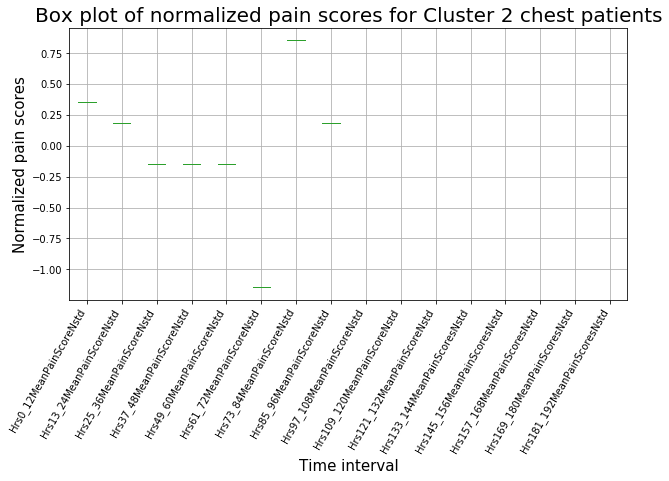

In [90]:
plt.figure(figsize = (10,5))
cluster2.boxplot()
plt.xticks(rotation = 60, ha='right')
plt.title("Box plot of normalized pain scores for Cluster 2 chest patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

This is the one outlier, so we do not look at this cluster 

# Cluster 3 pain plot

/Users/eileenzyf/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0.5,0,'Time interval')

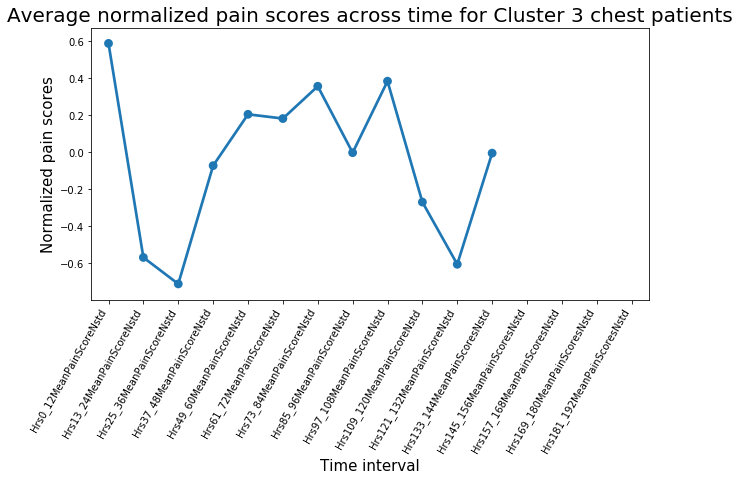

In [91]:
cluster3 = cluster3[standardized_cols]
plt.figure(figsize = (10,5))
sb.pointplot(list(cluster3.columns), [cluster3[rng].sum()/cluster3[rng].count() for rng in list(cluster3.columns)], order = list(cluster3.columns))
plt.xticks(rotation = 60, ha='right')
plt.title("Average normalized pain scores across time for Cluster 3 chest patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

Text(0.5,0,'Time interval')

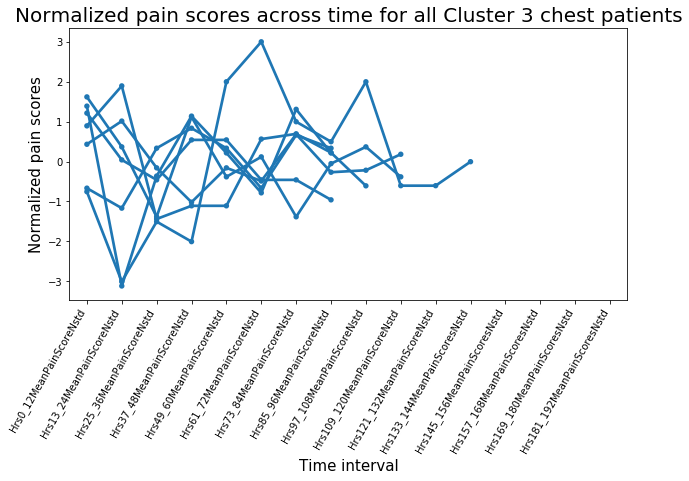

In [92]:
plt.figure(figsize = (10,5))
for i, (name, row) in enumerate(cluster3.iterrows()):
    sb.pointplot(list(cluster1.columns), row, order = list(cluster1.columns), markers = '.')
    plt.xticks(rotation = 60, ha='right')
plt.title("Normalized pain scores across time for all Cluster 3 chest patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

Text(0.5,0,'Time interval')

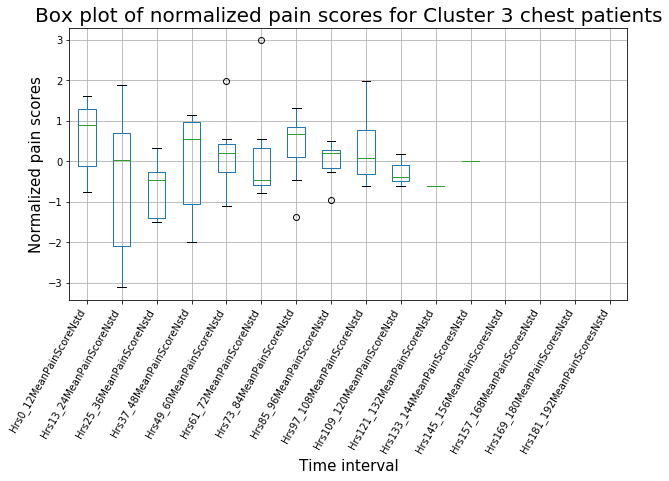

In [93]:
plt.figure(figsize = (10,5))
cluster3.boxplot()
plt.xticks(rotation = 60, ha='right')
plt.title("Box plot of normalized pain scores for Cluster 3 chest patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

# Cluster 4 Pain Plot

/Users/eileenzyf/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0.5,0,'Time interval')

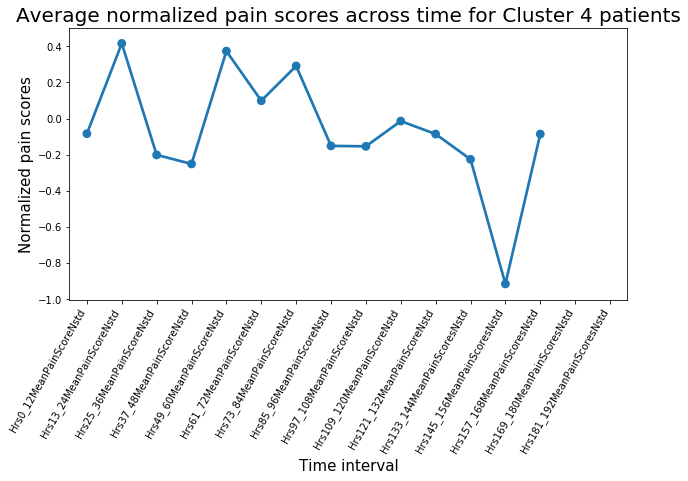

In [94]:
cluster4 = cluster4[standardized_cols]
plt.figure(figsize = (10,5))
sb.pointplot(list(cluster4.columns), [cluster4[rng].sum()/cluster4[rng].count() for rng in list(cluster4.columns)], order = list(cluster4.columns))
plt.xticks(rotation = 60, ha='right')
plt.title("Average normalized pain scores across time for Cluster 4 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

Text(0.5,0,'Time interval')

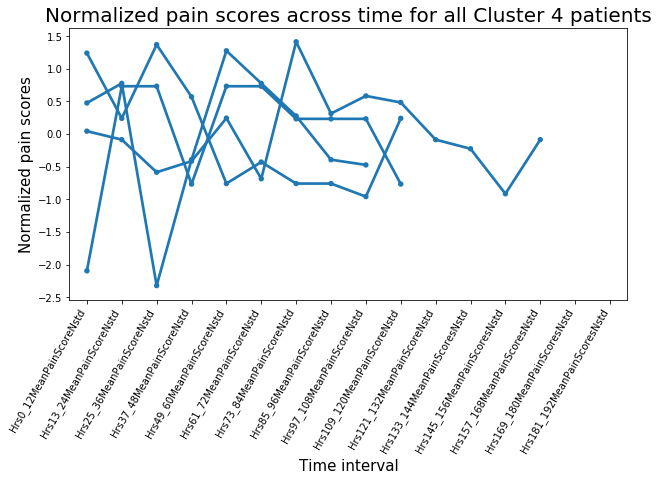

In [95]:
plt.figure(figsize = (10,5))
for i, (name, row) in enumerate(cluster4.iterrows()):
    sb.pointplot(list(cluster4.columns), row, order = list(cluster4.columns), markers = '.')
    plt.xticks(rotation = 60, ha='right')
plt.title("Normalized pain scores across time for all Cluster 4 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)


Text(0.5,0,'Time interval')

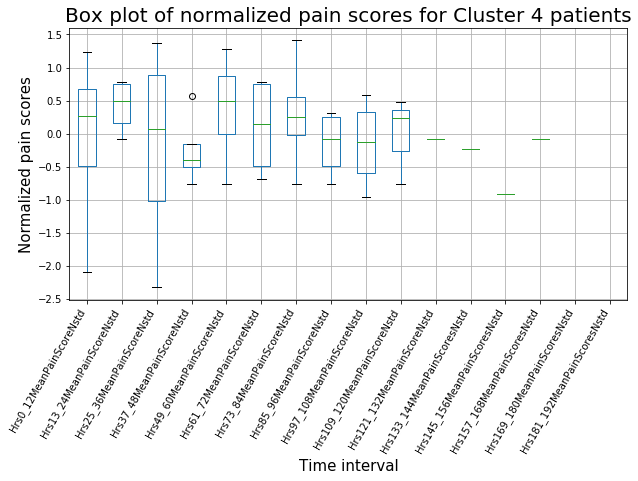

In [96]:
plt.figure(figsize = (10,5))
cluster4.boxplot()
plt.xticks(rotation = 60, ha='right')
plt.title("Box plot of normalized pain scores for Cluster 4 patients", size = 20)
plt.ylabel('Normalized pain scores', size = 15)
plt.xlabel('Time interval', size = 15)

# Total morphine equivalence vs. Patients' pain level

Main drugs: 1.Morphine 2.Dilaudid 3.Fentanyl 4.Other(specify)

Other drugs:

Supplemental opioids: 0.no 1.oral morphine or hydrocodone 2.oral diaudid 3.IV fentanyl 4.oxycodone 5.IV dilaudid 6.IV morphine 7.other

NSAID(oral/IV): 1.ketorolac 2.ibuprofen

Acetaminophen(no/oral/IV)

Epidural/OnQ Drug:1.Ropivicaine 0.1% 2.Ropivicaine 0.2% 3.Bupivicaine 0.1% 4.Bupivicaine 0.125%

Other meds: 0.no 1.methocarnamol 2.diazepam 3.neurontin 4.klonopin 5.clonidine

All five categories of other drugs were combined into one "morphine equivalence", so we can take a look at the total morphine equivalence from main drug and other drugs and how it related to the pain level.

# Spine surgery

In [174]:
# Merge spine surgery patients data with calculation sheet
spine_drug = spine_df.merge(df_morphine, left_on = 'PatientID', right_on = 'PatientID', how = 'left')
spine_drug

,"GroupingInclusions (1 include, 2 exclude)","Genetics (1 yes, 2=NO)",PatientGender,PatientAge,PatientWeight,PatientRace,"WhatSurgery (1=Nuss, 2= Spine, 3=other)",Haller Index (999= not applicable),Risser,"Top level (0-7 Cervical, 8-19 thoracic, 20-24-lumbar, 999 not applicable)",...,181-195 hrs supplemental opioid dose .1,181-195 hrs # of supplemental opioid doses.1,169-180 hrs mg/hr morphine equivalents (total/9 oral or total/1.8 IV) of dilaudid,181-195 hrs supplemental opioid dose .2,181-195 hrs # of supplemental opioid doses.2,181-95 hrs mg/hr morphine equivalents (total/24) of oxycodone,"181-195 hrs other meds 0-no, 1- methocarbamol, 2- diazepam, 3- neurontin, 4-klonopin, 5-clonidine",181-195 hrs other med dose,181-195 hrs # of other med doses,181-195 hrs Total mg/hr morphine equivalents
PatientID,,,,,,,,,,,,,,,,,,,,,
504,1,1,2,137,63.0,1,2,999.0,777.0,11,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
508,1,1,1,234,57.7,1,2,999.0,5.0,10,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
509,1,1,2,158,40.0,1,2,999.0,777.0,11,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
510,1,1,2,177,58.0,1,2,999.0,4.0,11,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
511,1,1,2,165,63.0,1,2,999.0,2.0,11,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
512,1,1,1,238,76.2,1,2,999.0,777.0,10,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
514,1,1,2,156,83.0,1,2,999.0,777.0,10,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
516,1,1,2,155,50.9,3,2,999.0,4.0,11,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
517,2,1,2,181,45.8,4,2,999.0,3.0,10,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [167]:
#use only 0-120 hr
pain_level =  spine_drug[["Hrs0_12MeanPainScoreVASstd","Hrs13_24MeanPainScoreVASstd","Hrs25_36MeanPainScoreVASstd",\
                        "Hrs37_48MeanPainScoreVASstd","Hrs49_60MeanPainScoreVASstd","Hrs61_72MeanPainScoreVASstd",\
                        "Hrs73_84MeanPainScoreVASstd","Hrs85_96MeanPainScoreVASstd","Hrs97_108MeanPainScoreVASstd",\
                         "Hrs109_120MeanPainScoreVASstd"]]
other_drug = spine_drug[["0-12 hrs Total mg/hr morphine equivalents",\
                        "13-24 hrs Total mg/hr morphine equivalents","25-36 hrs Total mg/hr morphine equivalents",\
                        "37-48 hrs Total mg/hr morphine equivalents","49-60 hrs Total mg/hr morphine equivalents",\
                        "61-72 hrs Total mg/hr morphine equivalents","73-84 hrs Total mg/hr morphine equivalents",\
                        "85-96 hrs Total mg/hr morphine equivalents","97-108 hrs  Total mg/hr morphine equivalents",\
                        "109-120 hrs Total mg/hr morphine equivalents"]]
main_drug = spine_drug[["0-12 hrs mg/hr morphine equivalents","13-24 hrs mg/hr morphine equivalents",\
                      "25-36 hrs mg/hr morphine equivalents","37-48 hrs mg/hr morphine equivalents",\
                      "49-60 hrs mg/hr morphine equivalents","61-72 hrs mg/hr morphine equivalents",\
                      "73-84 hrs mg/hr morphine equivalents","85-96 hrs mg/hr morphine equivalents",\
                      "97-108 hrs mg/hr morphine equivalents","109-120 hrs mg/hr morphine equivalents"]]

In [162]:
pain_level.head(10)

,Hrs0_12MeanPainScoreVASstd,Hrs13_24MeanPainScoreVASstd,Hrs25_36MeanPainScoreVASstd,Hrs37_48MeanPainScoreVASstd,Hrs49_60MeanPainScoreVASstd,Hrs61_72MeanPainScoreVASstd,Hrs73_84MeanPainScoreVASstd,Hrs85_96MeanPainScoreVASstd,Hrs97_108MeanPainScoreVASstd,Hrs109_120MeanPainScoreVASstd
PatientID,,,,,,,,,,
501,7.919208,8.079208,7.459208,7.449208,7.749208,6.579208,5.959208,7.499208,7.749208,6.079208
502,3.530917,3.860917,3.200917,3.030917,3.530917,3.200917,1.030917,2.530917,NaN,NaN
503,5.406583,0.906583,3.656583,5.156583,4.236583,3.236583,5.326583,4.236583,NaN,NaN
505,2.325375,5.115375,3.575375,4.025375,3.155375,3.115375,6.825375,4.575375,5.075375,3.575375
507,1.071976,-1.178024,0.321976,-0.178024,3.821976,4.821976,2.821976,2.321976,3.821976,1.221976
518,3.837467,4.137467,1.037467,2.967467,4.637467,4.137467,3.637467,2.967467,2.887467,NaN
521,3.369000,3.769000,3.079000,2.369000,2.869000,3.569000,4.119000,3.749000,3.569000,3.039000
522,5.478667,4.228667,2.478667,4.978667,3.478667,3.978667,2.478667,3.808667,4.228667,3.478667
524,8.283250,7.113250,6.613250,7.613250,7.613250,6.613250,6.613250,6.113250,NaN,NaN


In [163]:
other_drug.head(10)

,0-12 hrs Total mg/hr morphine equivalents,13-24 hrs Total mg/hr morphine equivalents,25-36 hrs Total mg/hr morphine equivalents,37-48 hrs Total mg/hr morphine equivalents,49-60 hrs Total mg/hr morphine equivalents,61-72 hrs Total mg/hr morphine equivalents,73-84 hrs Total mg/hr morphine equivalents,85-96 hrs Total mg/hr morphine equivalents,97-108 hrs Total mg/hr morphine equivalents,109-120 hrs Total mg/hr morphine equivalents
PatientID,,,,,,,,,,
501,4.000000,4.220000,3.660000,4.040000,4.060000,3.223833,5.335000,4.640000,2.028583,1.973000
502,3.534600,4.334500,4.779167,4.890333,4.334500,4.195333,2.847333,2.416667,0.000000,0.000000
503,3.580000,3.250000,5.330000,3.710000,4.790000,4.833333,1.666667,1.666667,0.000000,0.000000
505,2.889333,5.668500,4.473458,5.001500,5.629592,4.779667,4.168500,3.389500,1.458333,1.250000
507,4.967750,4.812583,4.534667,5.535167,4.145583,3.156250,3.783667,1.666667,5.300000,2.000000
518,2.878583,2.433917,2.267167,2.433917,2.433917,2.156000,2.600667,2.405917,2.100000,1.258333
521,1.834250,4.023333,3.411917,4.323483,3.356333,4.550333,3.883333,2.083333,1.250000,1.666667
522,3.056083,3.834250,3.445167,4.445667,3.523483,4.112167,3.111667,2.194833,0.416667,0.416667
524,1.389583,4.556833,4.001000,4.112167,3.889833,4.736750,2.875000,1.666667,NaN,0.000000


In [164]:
main_drug.head(10)

,0-12 hrs mg/hr morphine equivalents,13-24 hrs mg/hr morphine equivalents,25-36 hrs mg/hr morphine equivalents,37-48 hrs mg/hr morphine equivalents,49-60 hrs mg/hr morphine equivalents,61-72 hrs mg/hr morphine equivalents,73-84 hrs mg/hr morphine equivalents,85-96 hrs mg/hr morphine equivalents,97-108 hrs mg/hr morphine equivalents,109-120 hrs mg/hr morphine equivalents
PatientID,,,,,,,,,,
501,2.000000,2.220000,1.660000,2.040000,2.060000,3.223833,3.335000,2.223333,1.611917,1.556333
502,2.534600,2.334500,2.779167,2.890333,2.334500,1.778667,0.222333,NaN,NaN,NaN
503,1.580000,1.250000,3.330000,1.710000,1.540000,0.750000,NaN,NaN,NaN,NaN
505,0.889333,3.668500,2.473458,3.001500,3.629592,3.779667,3.668500,1.222833,NaN,NaN
507,2.167750,2.945917,2.668000,3.668500,2.278917,1.389583,0.667000,NaN,NaN,NaN
518,1.611917,1.167250,1.000500,1.167250,1.167250,0.889333,1.334000,0.722583,NaN,NaN
521,1.834250,2.223333,1.611917,2.523483,1.556333,0.667000,NaN,NaN,NaN,NaN
522,1.056083,1.834250,1.445167,2.445667,2.523483,2.112167,1.111667,0.778167,NaN,NaN
524,1.389583,2.556833,2.001000,2.112167,1.889833,1.278417,NaN,NaN,NaN,NaN


C:\Users\qtang\Anaconda3\lib\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


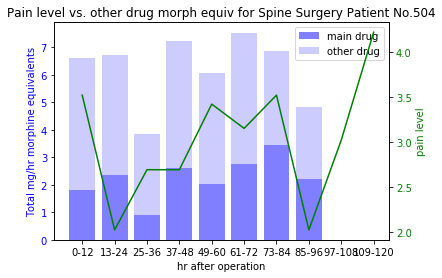

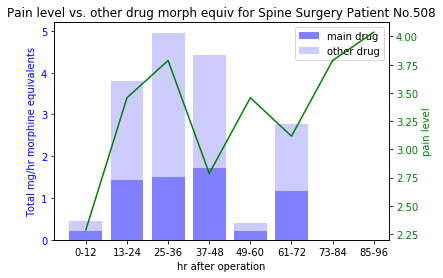

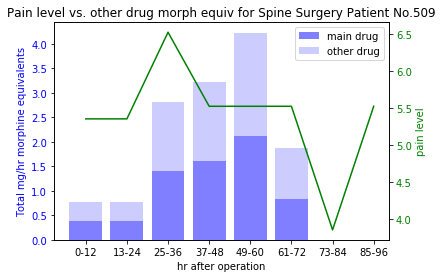

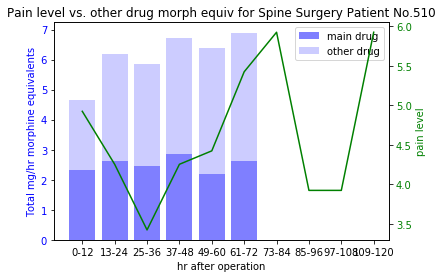

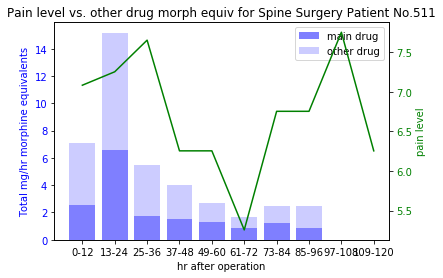

...

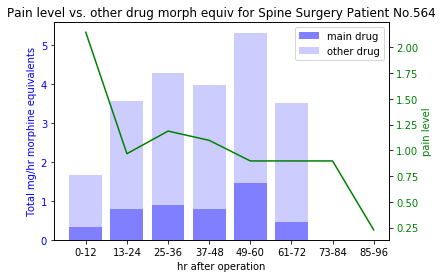

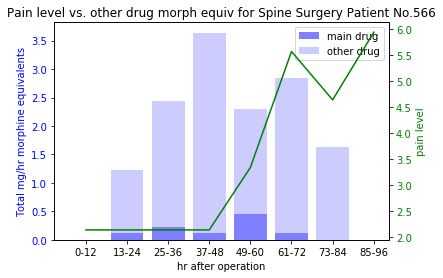

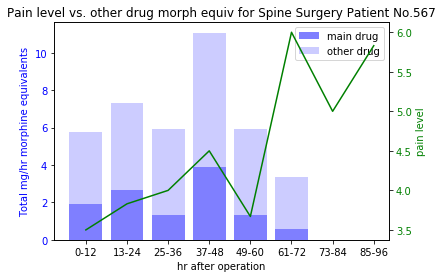

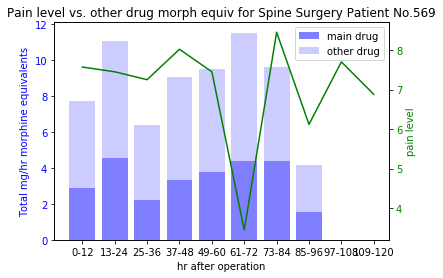

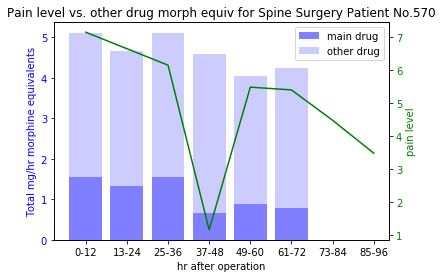

In [168]:
#plot for each individual patient who received spine surgery

for i in range(0,42):
    df = pd.DataFrame({
    "hr_after_operation": ["0-12","13-24","25-36","37-48","49-60","61-72","73-84","85-96","97-108","109-120"],
    "mean pain score": list(pain_level.iloc[i,:]),
    "main drug morph equiv":list(main_drug.iloc[i,:]),
    "other drug morph equiv": list(other_drug.iloc[i,:])})
    fig, ax1 = plt.subplots()
    ax1.bar(df["hr_after_operation"], df["main drug morph equiv"], align='center', alpha=0.5,color='b',label="main drug")
    ax1.bar(df["hr_after_operation"], df["other drug morph equiv"], bottom=df["main drug morph equiv"],\
            align='center',alpha=0.2,color='b',label="other drug")
    ax1.legend(loc="upper right")
    ax1.set_xlabel("hr after operation")
    # Make the y-axis label and tick labels match the line color.
    ax1.set_ylabel("Total mg/hr morphine equivalents", color='b')
    [tl.set_color('b') for tl in ax1.get_yticklabels()]
    plt.title('Pain level vs. other drug morph equiv for Spine Surgery Patient No.'+ str(other_drug.index[i]))
    #Set up ax2 to be the second y axis with x shared
    ax2 = ax1.twinx()
    #Plot a line
    ax2.plot(df["hr_after_operation"], df["mean pain score"], 'g-')
    # Make the y-axis label and tick labels match the line color.
    ax2.set_ylabel('pain level', color='g')
    [tl.set_color('g') for tl in ax2.get_yticklabels()]


# Chest surgery

In [175]:
# Merge chest surgery patients data with calculation sheet
chest_drug = chest_df.merge(df_morphine, left_on = 'PatientID', right_on = 'PatientID', how = 'left')
chest_drug

,"GroupingInclusions (1 include, 2 exclude)","Genetics (1 yes, 2=NO)",PatientGender,PatientAge,PatientWeight,PatientRace,"WhatSurgery (1=Nuss, 2= Spine, 3=other)",Haller Index (999= not applicable),Risser,"Top level (0-7 Cervical, 8-19 thoracic, 20-24-lumbar, 999 not applicable)",...,181-195 hrs supplemental opioid dose .1,181-195 hrs # of supplemental opioid doses.1,169-180 hrs mg/hr morphine equivalents (total/9 oral or total/1.8 IV) of dilaudid,181-195 hrs supplemental opioid dose .2,181-195 hrs # of supplemental opioid doses.2,181-95 hrs mg/hr morphine equivalents (total/24) of oxycodone,"181-195 hrs other meds 0-no, 1- methocarbamol, 2- diazepam, 3- neurontin, 4-klonopin, 5-clonidine",181-195 hrs other med dose,181-195 hrs # of other med doses,181-195 hrs Total mg/hr morphine equivalents
PatientID,,,,,,,,,,,,,,,,,,,,,
501,1,1,1,194,65.0,1,1,3.90,999.0,999,...,NaN,NaN,0.0,5.0,5.0,1.041667,1 oral,500.0,1.0,1.041667
502,1,1,1,179,57.0,1,1,3.86,999.0,999,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
503,1,1,1,185,68.0,1,1,3.90,999.0,999,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
505,1,1,1,180,66.0,1,1,3.10,999.0,999,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
507,1,1,1,167,55.0,1,1,5.90,999.0,999,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
518,1,1,1,170,38.0,1,1,3.20,999.0,999,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
521,1,1,1,178,53.0,1,1,5.50,999.0,999,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
522,1,1,1,225,71.5,1,1,3.98,999.0,999,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
524,1,1,1,237,61.7,1,1,5.30,999.0,999,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [176]:
#only use 0-120 hr
pain_level =  chest_drug[["Hrs0_12MeanPainScoreVASstd","Hrs13_24MeanPainScoreVASstd","Hrs25_36MeanPainScoreVASstd",\
                        "Hrs37_48MeanPainScoreVASstd","Hrs49_60MeanPainScoreVASstd","Hrs61_72MeanPainScoreVASstd",\
                        "Hrs73_84MeanPainScoreVASstd","Hrs85_96MeanPainScoreVASstd","Hrs97_108MeanPainScoreVASstd",\
                         "Hrs109_120MeanPainScoreVASstd"]]
other_drug = chest_drug[["0-12 hrs Total mg/hr morphine equivalents",\
                        "13-24 hrs Total mg/hr morphine equivalents","25-36 hrs Total mg/hr morphine equivalents",\
                        "37-48 hrs Total mg/hr morphine equivalents","49-60 hrs Total mg/hr morphine equivalents",\
                        "61-72 hrs Total mg/hr morphine equivalents","73-84 hrs Total mg/hr morphine equivalents",\
                        "85-96 hrs Total mg/hr morphine equivalents","97-108 hrs  Total mg/hr morphine equivalents",\
                        "109-120 hrs Total mg/hr morphine equivalents"]]
main_drug = chest_drug[["0-12 hrs mg/hr morphine equivalents","13-24 hrs mg/hr morphine equivalents",\
                      "25-36 hrs mg/hr morphine equivalents","37-48 hrs mg/hr morphine equivalents",\
                      "49-60 hrs mg/hr morphine equivalents","61-72 hrs mg/hr morphine equivalents",\
                      "73-84 hrs mg/hr morphine equivalents","85-96 hrs mg/hr morphine equivalents",\
                      "97-108 hrs mg/hr morphine equivalents","109-120 hrs mg/hr morphine equivalents"]]

In [179]:
pain_level.head(10)

,Hrs0_12MeanPainScoreVASstd,Hrs13_24MeanPainScoreVASstd,Hrs25_36MeanPainScoreVASstd,Hrs37_48MeanPainScoreVASstd,Hrs49_60MeanPainScoreVASstd,Hrs61_72MeanPainScoreVASstd,Hrs73_84MeanPainScoreVASstd,Hrs85_96MeanPainScoreVASstd,Hrs97_108MeanPainScoreVASstd,Hrs109_120MeanPainScoreVASstd
PatientID,,,,,,,,,,
501,7.919208,8.079208,7.459208,7.449208,7.749208,6.579208,5.959208,7.499208,7.749208,6.079208
502,3.530917,3.860917,3.200917,3.030917,3.530917,3.200917,1.030917,2.530917,NaN,NaN
503,5.406583,0.906583,3.656583,5.156583,4.236583,3.236583,5.326583,4.236583,NaN,NaN
505,2.325375,5.115375,3.575375,4.025375,3.155375,3.115375,6.825375,4.575375,5.075375,3.575375
507,1.071976,-1.178024,0.321976,-0.178024,3.821976,4.821976,2.821976,2.321976,3.821976,1.221976
518,3.837467,4.137467,1.037467,2.967467,4.637467,4.137467,3.637467,2.967467,2.887467,NaN
521,3.369000,3.769000,3.079000,2.369000,2.869000,3.569000,4.119000,3.749000,3.569000,3.039000
522,5.478667,4.228667,2.478667,4.978667,3.478667,3.978667,2.478667,3.808667,4.228667,3.478667
524,8.283250,7.113250,6.613250,7.613250,7.613250,6.613250,6.613250,6.113250,NaN,NaN


In [180]:
other_drug.head(10)

,0-12 hrs Total mg/hr morphine equivalents,13-24 hrs Total mg/hr morphine equivalents,25-36 hrs Total mg/hr morphine equivalents,37-48 hrs Total mg/hr morphine equivalents,49-60 hrs Total mg/hr morphine equivalents,61-72 hrs Total mg/hr morphine equivalents,73-84 hrs Total mg/hr morphine equivalents,85-96 hrs Total mg/hr morphine equivalents,97-108 hrs Total mg/hr morphine equivalents,109-120 hrs Total mg/hr morphine equivalents
PatientID,,,,,,,,,,
501,4.000000,4.220000,3.660000,4.040000,4.060000,3.223833,5.335000,4.640000,2.028583,1.973000
502,3.534600,4.334500,4.779167,4.890333,4.334500,4.195333,2.847333,2.416667,0.000000,0.000000
503,3.580000,3.250000,5.330000,3.710000,4.790000,4.833333,1.666667,1.666667,0.000000,0.000000
505,2.889333,5.668500,4.473458,5.001500,5.629592,4.779667,4.168500,3.389500,1.458333,1.250000
507,4.967750,4.812583,4.534667,5.535167,4.145583,3.156250,3.783667,1.666667,5.300000,2.000000
518,2.878583,2.433917,2.267167,2.433917,2.433917,2.156000,2.600667,2.405917,2.100000,1.258333
521,1.834250,4.023333,3.411917,4.323483,3.356333,4.550333,3.883333,2.083333,1.250000,1.666667
522,3.056083,3.834250,3.445167,4.445667,3.523483,4.112167,3.111667,2.194833,0.416667,0.416667
524,1.389583,4.556833,4.001000,4.112167,3.889833,4.736750,2.875000,1.666667,NaN,0.000000


In [181]:
main_drug.head(10)

,0-12 hrs mg/hr morphine equivalents,13-24 hrs mg/hr morphine equivalents,25-36 hrs mg/hr morphine equivalents,37-48 hrs mg/hr morphine equivalents,49-60 hrs mg/hr morphine equivalents,61-72 hrs mg/hr morphine equivalents,73-84 hrs mg/hr morphine equivalents,85-96 hrs mg/hr morphine equivalents,97-108 hrs mg/hr morphine equivalents,109-120 hrs mg/hr morphine equivalents
PatientID,,,,,,,,,,
501,2.000000,2.220000,1.660000,2.040000,2.060000,3.223833,3.335000,2.223333,1.611917,1.556333
502,2.534600,2.334500,2.779167,2.890333,2.334500,1.778667,0.222333,NaN,NaN,NaN
503,1.580000,1.250000,3.330000,1.710000,1.540000,0.750000,NaN,NaN,NaN,NaN
505,0.889333,3.668500,2.473458,3.001500,3.629592,3.779667,3.668500,1.222833,NaN,NaN
507,2.167750,2.945917,2.668000,3.668500,2.278917,1.389583,0.667000,NaN,NaN,NaN
518,1.611917,1.167250,1.000500,1.167250,1.167250,0.889333,1.334000,0.722583,NaN,NaN
521,1.834250,2.223333,1.611917,2.523483,1.556333,0.667000,NaN,NaN,NaN,NaN
522,1.056083,1.834250,1.445167,2.445667,2.523483,2.112167,1.111667,0.778167,NaN,NaN
524,1.389583,2.556833,2.001000,2.112167,1.889833,1.278417,NaN,NaN,NaN,NaN


C:\Users\qtang\Anaconda3\lib\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


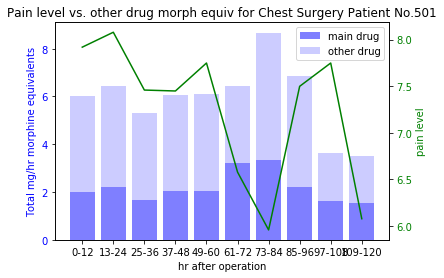

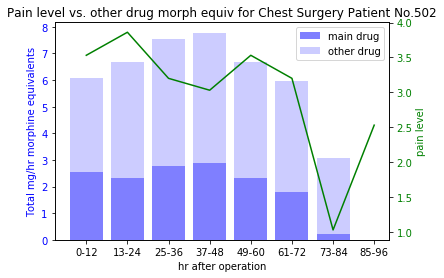

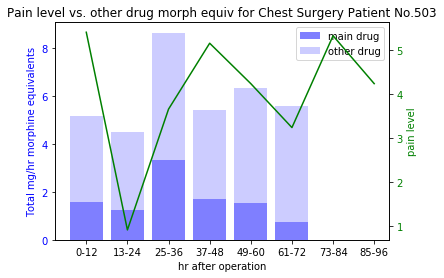

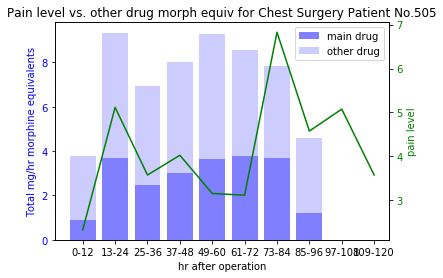

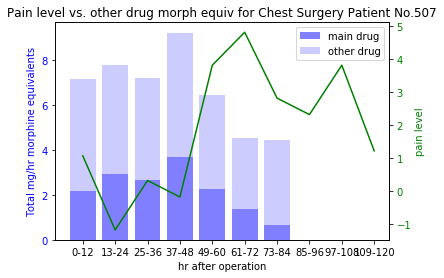

...

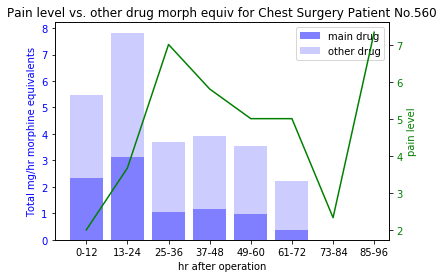

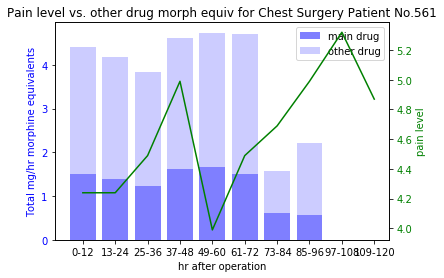

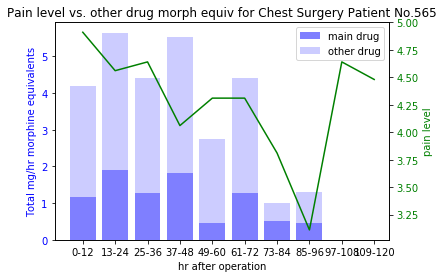

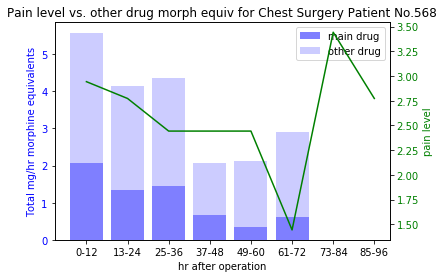

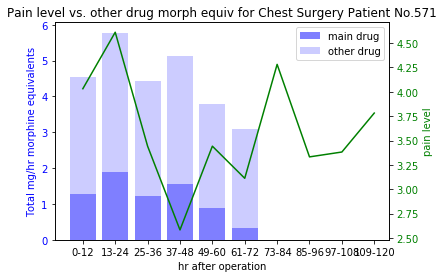

In [178]:
#plot for each individual patient who received chest surgery

for i in range(0,24):
    df = pd.DataFrame({
    "hr_after_operation": ["0-12","13-24","25-36","37-48","49-60","61-72","73-84","85-96","97-108","109-120"],
    "mean pain score": list(pain_level.iloc[i,:]),
    "main drug morph equiv":list(main_drug.iloc[i,:]),
    "other drug morph equiv": list(other_drug.iloc[i,:])})
    fig, ax1 = plt.subplots()
    ax1.bar(df["hr_after_operation"], df["main drug morph equiv"], align='center', alpha=0.5,color='b',label="main drug")
    ax1.bar(df["hr_after_operation"], df["other drug morph equiv"], bottom=df["main drug morph equiv"],\
            align='center',alpha=0.2,color='b',label="other drug")
    ax1.legend(loc="upper right")
    ax1.set_xlabel("hr after operation")
    # Make the y-axis label and tick labels match the line color.
    ax1.set_ylabel("Total mg/hr morphine equivalents", color='b')
    [tl.set_color('b') for tl in ax1.get_yticklabels()]
    plt.title('Pain level vs. other drug morph equiv for Chest Surgery Patient No.'+ str(other_drug.index[i]))
    #Set up ax2 to be the second y axis with x shared
    ax2 = ax1.twinx()
    #Plot a line
    ax2.plot(df["hr_after_operation"], df["mean pain score"], 'g-')
    # Make the y-axis label and tick labels match the line color.
    ax2.set_ylabel('pain level', color='g')
    [tl.set_color('g') for tl in ax2.get_yticklabels()]